## 100bit Analysis
### Drawing in a Community with Limitations
#### Heatmaps/Data of 100bit
---
This is the jupyter notebook for the functions that deal with graphing 100bit's data. If you would like to see the code that I used to actually crawl/collect 100bit's data, check out the jupyter notebook labeled "100 Bit Crawler."

Some context for how 100bit works:
- Players are able to toggle pixels on a 256x192 board between black and white, but they can only make up to 100 changes every 6 hours. I sometimes refer to these changes as "edits", and a group of changes a user made in one instance is called an "upload".

- Changes are recorded in "No."s, it is possible to see the entire history of 100bit using No.'s (see it for yourself at: https://dan-ball.jp/en/javagame/bit/history/).

- Due to the limited drawing space, players are forced to draw over others' drawings. It is a bit like virtually making sand castles, impermanence is baked into the game's design.

- 100bit has a "Noise Clear" tool which allows users to quickly change pixels in the following manner: if a pixel is surrounded by 8 pixels of the opposite color, the Noise Clear tool will toggle that pixel's color to match its surroundings. Why this is relevant will be discussed further below with the heatmaps.

- 100bit first began in 2011, so there is quite a lot of data hidden under the surface!

- Note: due to the online nature of 100bit, there may be some crude drawings/usernames.

Here are the functions that I use for graphing heatmaps. There are two main types of heatmaps: One is a logarithmically scaled heatmap that shows the number of times specific pixels were edited (e.g., "warmer" pixels show areas of frequent player activity, possibly because two or more players were fighting to erase/maintain a drawing).

The other heatmaps are black and white, and represent the average color of each pixel. While the edit heatmaps capture areas of conflict, the black and white heatmap shows drawings that were "resilient" (e.g., either users fought dilligently to keep that drawing the exact same, or few players bothered editing it).

In [10]:
from matplotlib import pyplot as plt
import matplotlib.colors as colors
import matplotlib.animation as animation
import numpy as np
from matplotlib.ticker import LogFormatter
from math import ceil
from copy import copy

def plotHeatMap(data, x_title='X Axis', y_title='Y Axis', title='', x_ticks=[], y_ticks=[], blackAndWhite = False):
    scale = 0.05
    plt.figure(figsize=(256*scale,192*scale))
    #xData, yData = zip(data)
    #print(xData, yData)
    positiveMin = data.min()
    tickMarks = []
    tickMarksString = []
    if (data.min() <= 0):
        positiveMin = 1
        tickMarks.append(positiveMin)
        tickMarksString.append(str(positiveMin))
    #Setting default (missing) color referenced from: https://matplotlib.org/2.0.2/examples/pylab_examples/image_masked.html
    if (blackAndWhite == False):
        palette = copy(plt.cm.viridis)
        palette.set_bad(palette.colors[0])
        plt.pcolor(data, cmap = palette, norm=colors.LogNorm(vmin=max(data.min(), 0.1), vmax=data.max()), snap=True)
        tickRange = 10
        tickPlacement = (data.max()-data.min()) / tickRange
        #Adding ticks to logarithmic colorbar referenced from: https://stackoverflow.com/questions/27345005/log-labels-on-colorbar-matplotlib
        for i in range(0, tickRange):
            if (i > tickRange/2):
                if ((i % 2) == 1):
                    continue
            tickMarks.append(ceil(tickPlacement*i+data.min()))
            tickMarksString.append(str(ceil(tickPlacement*i+data.min())))
        cbar = plt.colorbar(ticks = tickMarks)
        cbar.ax.set_yticklabels(tickMarksString)  # vertically oriented colorbar
        cbar.ax.tick_params(labelsize = 20)
    else: #blackAndWhite == True
        palette = copy(plt.cm.gray_r)
        plt.pcolor(data, cmap = palette, snap=True)
        cbar = plt.colorbar()
        #cbar = plt.colorbar(ticks = [0.25, 0.5, 0.75, 1])
        #cbar.ax.set_yticklabels(["25%", "50%", "75%", "100%"])  # vertically oriented colorbar
        cbar.ax.tick_params(labelsize = 20)
    plt.title(title, fontsize = 26)
    plt.xlabel(x_title, fontsize = 22)
    plt.ylabel(y_title, fontsize = 22)
    plt.xticks(x_ticks, fontsize = 20)
    plt.yticks(y_ticks, fontsize = 20)
    plt.xlim(0, 256)
    plt.ylim(192, 0)
    plt.show()

These are the main functions for crawling the 100bit data dump, at which point they either print something out or send data to the heatmaps. Most functions use the following variables:
wb - short for "workbook," or the file being used for 100bit's data dump.
start & end - which No. to start/end at. Note that the range for starting/stopping is inclusive (e.g., end = 5 also means No. 5 is included).
userFilter - For some functions, it is possible to select specific users (e.g., because you want to see how the edit heatmap would look if it was only based on a particular player's changes). While I could have completed this project without adding this feature, the 100bit community got a kick out of getting to see what their heatmap looked like, what their first upload to 100bit was, etc.. If empty, the user filter is ignored. 

In [11]:
import pandas as pd
import sys
import iterFunctions as iter
import numpy as np
#import graphFunctions as graph
import codecs #used to print unicode characters, referenced from: https://stackoverflow.com/questions/10569438/how-to-print-unicode-character-in-python

def getPixelsByPopularity(wb, start, end, userFilter=[]):
    '''
    getPixelsByPopularity()
    A function to determine which pixels were edited the most. Prints out a sorted list of some of the most edited pixels,
    in addition to returning some variables which are later used to form heatmaps.
    '''
    print("Getting number of changes for each pixel...")
    data = []
    userUploads = {} # If user filter present, track which particular No a user edited in
    firstOccurence = -1 #If using a user filter, track when the first and last No. was where the user edited in
    lastOccurence = -1
    for num in range(start, end+1):
        dotPlacements = stringToList(getNoData(wb, num, "Dot Placements"))
        if (len(userFilter) > 0):
            filteredDotPlacements = []
            users = getNoData(wb, num, "Users")
            users = [i for i in map(str, users.split(","))]
            dotOwner = stringToList(getNoData(wb, num, "Dot Owner"))
            for user in userFilter:
                if user in users:
                    for userPosition in iter.findInList(user, users):
                        if num not in userUploads:
                            userUploads[num] = 0
                        userUploads[num] += 1
                        if (firstOccurence == -1):
                            firstOccurence = num
                        lastOccurence = num
                        try:
                            dotPosition = dotOwner.index(userPosition)
                        except ValueError:
                            #Note: there is a rare case where someone can upload to 100bit WITHOUT drawing anything.
                            #This 'continue' will trigger if that happens, and the upload without any dots drawn will be skipped.
                            continue
                        ownerNumber = dotOwner[dotPosition]
                        #ownerNumber = dotOwner[userPosition]
                        #print("Owner Num:", ownerNumber)
                        currentPos = dotPosition
                        while ((currentPos < len(dotOwner)) and (dotOwner[currentPos] == ownerNumber)):
                            #print(" Got: ", dotPlacements[currentPos], end="")
                            filteredDotPlacements.append(dotPlacements[currentPos])
                            currentPos += 1
            dotPlacements = filteredDotPlacements
            #for pixel in filteredDotPlacements:
            #    print('\tx{:<5d} y{:<5d}'.format(pixel % 256, pixel // 256))
        data += dotPlacements
        #print(df)
    if (len(data) == 0):
        sys.exit("No edits were made between No."+ str(start) + " and No." + str(end) + " with the specified user filter: " + ', '.join(userFilter))
    if(len(userUploads) > 0):
        print("Filtered user uploads per No.:")
        for key in userUploads:
            print("\t", userUploads[key], "in No.", str(key))
    #print(data[0:100])
    #data = iter.flatMapSequential(data, iter.splitCommaList)
    pixel_keyvalues = iter.mapSequential(data, iter.makeKeyValue)
    #print("Pixel key", pixel_keyvalues[0:100])
    pixel_counts = iter.reduceByKeySequential(pixel_keyvalues, iter.addValues)
    #print("Pixel values: ", pixel_counts[0:100])
    pixel_counts_sorted = sorted(pixel_counts, key=lambda x: x[1], reverse=True)
    pixel_counts2D = np.zeros(shape=(192,256))
    #print(pixel_counts)
    totalCount = 0
    for pixel, count in pixel_counts:
        if (pixel == -1):
            continue
        totalCount += count
        pixel_counts2D[pixel // 256][pixel % 256] = count
    print("Total pixels edited:", totalCount)
    print("Mean edits per pixel:", totalCount / (192* 256))
    print("Pixels sorted by # of times edited:")
    for pixel, count in pixel_counts_sorted[0:10]:
        if (pixel == -1):
            continue
        print('x{:<5d} y{:<5d}: {:>6d}'.format(pixel % 256, pixel // 256, count))
    leastPopularPixel, leastPopularCount = pixel_counts_sorted[-1]
    print("Least popular pixel was at: x{:d} y{:d} with {:d} edits.".format(leastPopularPixel % 256, leastPopularPixel // 256, leastPopularCount))
    return pixel_counts2D, firstOccurence, lastOccurence

def getUserEditCount(wb, start, end):
    '''
    getUserEditCount()
    A function for finding out how many total edits (pixel changes) each user made.
    Returns a dictionary object which I later use to print out users sorted by edit counts.
    '''
    userDotCount = {}
    for num in range(start, end+1):
        #print("On no:", num)
        users = getNoData(wb, num, "Users")
        users = [i for i in map(str, users.split(","))]
        dotOwner = stringToList(getNoData(wb, num, "Dot Owner"))
        dotCountsPerUser = iter.mapSequential(dotOwner, iter.makeKeyValue)
        dotCountsPerUser = iter.reduceByKeySequential(dotCountsPerUser, iter.addValues)
        #print(dotCountsPerUser[0:100])
        for count in dotCountsPerUser:
            currentUser = users[count[0]]
            if currentUser in userDotCount:
                userDotCount[currentUser] += count[1]
            else:
                userDotCount[currentUser] = count[1]
    return userDotCount

def getPixelColorAverages(wb, start, end, userFilter = []):
    '''
    getPixelColorAverages()
    A function to get the average color for each pixel of the grid.
    Average color is represented with float values, where a pixel that was always black for all No.s is 1, and always white is 0.
    To determine how long a pixel was one color, I do the following:
    1. Give a point to each black pixel on the starting grid, and add 1 to totalpoints
    2. Apply the edits made by a user's upload
    3. Give a point to each black pixel on current grid, add 1 to totalpoints (if userFilter is active, only perform this step if
        the last user who made an edit was in the userFilter)
    4. Divide each pixel's points by totalpoints, and you have the averages!
    Returns the pixel averages which I later use for graphing average color heatmaps.
    '''
    print("Getting average color of pixels...")
    totalPixelEdits = 1
    currentGrid = np.array(stringToList(getNoData(wb, start, "Starting Grid")))
    #print(currentGrid[0:100])
    pixelAverages = np.array(currentGrid)
    for num in range(start, end+1):
        if (not np.array_equal(currentGrid, np.array(stringToList(getNoData(wb, num, "Starting Grid"))))):
            print("Error! The current grid does not match up with the start of No.", num, "s grid!")
            printGrid(currentGrid)
            return
        #print("Current no:", num)
        dotOwners = stringToList(getNoData(wb, num, "Dot Owner"))
        dotPlacements = stringToList(getNoData(wb, num, "Dot Placements"))
        users = getNoData(wb, num, "Users")
        users = [i for i in map(str, users.split(","))]
        edits = []
        currentOwner = 0
        for i, owner in enumerate(dotOwners):
            if(currentOwner == dotOwners[i]):
                edits.append(dotPlacements[i])
            else:
                #print("Edits:", edits)
                currentGrid = editGrid(currentGrid, edits)
                if(len(userFilter) == 0):
                    totalPixelEdits += 1
                    pixelAverages = np.add(pixelAverages, currentGrid)
                else:
                    if(users[owner] in userFilter):
                        totalPixelEdits += 1
                        pixelAverages = np.add(pixelAverages, currentGrid)
                edits = [dotPlacements[i]]
                currentOwner = dotOwners[i]
        totalPixelEdits += 1
        currentGrid = editGrid(currentGrid, edits)
        pixelAverages = np.add(pixelAverages, currentGrid)
    pixelAverages = pixelAverages * (1 / totalPixelEdits)
    print("Finished, total edits:", totalPixelEdits)
    pixelAverages2D = np.zeros(shape=(192,256))
    for pixel, avg in enumerate(pixelAverages):
        if (pixel == -1):
            continue
        pixelAverages2D[pixel // 256][pixel % 256] = avg
    return pixelAverages2D

def editGrid(grid, edits):
    '''
    editGrid()
    A helper function for modifying the current grid based on a list of edits.
    Edits toggle a pixel to and from black and white.
    Returns the modified grid.
    '''
    for e in edits:
        #print(e, ",", end = "")
        if (grid[e] == 1):
            grid[e] = 0
        else:
            grid[e] = 1
    return grid

def printGrid(grid):
    '''
    printGrid()
    A debug function used to see what the current grid looks like in a more human-readable form.
    '''
    toPrint = ""
    for i, pixel in enumerate(grid):
        if ((i % 256) == 0):
            toPrint += "\n"
        if (pixel == 1):
            toPrint += u"▮"
        elif (pixel == 0):
            toPrint += u"▯"
        else:
            toPrint += "?"
    print(toPrint)


def getNoData(wb, No, col):
    '''
    getNoData()
    A helper function to extract data from cell(s) of the workbook.
    Since some data was too big to fit in one cell, I had to write data in columns,
    hence why this function grabs all data in a column and returns it.
    wb = The workbook object
    No = an int representing the No. to read from (e.g., 1 for No. 1)
    col = a string that represents which column to read from (e.g., "Dot Placements")
    Returns a string which represents all non-empty cells under the specified column.
    '''
    NoData = wb["No." + str(No)]
    currentRow = 0
    data = ""
    #Keep reading data from a column until an empty cell is encountered
    for value in NoData[col].values:
        if ((type(value) != type("string")) and (np.isnan(value))):
            break
        data += str(value)
        currentRow += 1
    return data

def stringToList(stringThing, delimiter = ","):
    '''
    stringToList()
    A helper function for "splitting,comma,delimited,lists" into list objects.
    stringThing = A string object that is separated by some delimiter (commas by default)
    delimiter = What separates each item in the stringThing list
    Returns a list object.
    '''   
    data = [i for i in map(int, stringThing.split(delimiter))]
    return data

def main(args):
    '''
    main()
    Originally, I ran this code on a command line, hence why this function is called main().
    Returns a workbook object which can be used by most of the other functions in this cell.
    '''
    startNo = 1
    endNo = 583
    inputFile = "100bitdump.xlsx"
    if "start" in args:
        startNo = int(args["start"])
        endNo = int(args["start"])
    if "end" in args:
        endNo = int(args["end"])
    if "input" in args:
        inputFile = args["input"]
    wb = pd.read_excel(inputFile, sheet_name=None)
    return wb


The parameters to use for the 100bit data dump. Make sure "start" and "end" are within the ranges of No.s that the selected .xlsx file contains. The user filter is disabled by default, but if you modify userFilter (e.g., userFilter = ["Dave dood", "XisN"]), you can create heatmaps based on specific users.

In [12]:
args = {
    "start": 1,
    "end": 590,
    "input": "100bitdump.xlsx"
}
#userFilter = ["someUserHere"]
userFilter = []
wb = main(args)

Here are some functions I use to get the average color and edit count of each pixel. The data is used below for graphing, but the getPixelsByPopularity function also displays some interesting tidbits. Notably, 100bit had recently breached 10 million pixel edits when I first started this project (at No. 583)!

In [13]:
pixelAverages2D = getPixelColorAverages(wb, args["start"], args["end"], userFilter)
pixel_counts2D, firstOccurence, lastOccurence = getPixelsByPopularity(wb, args["start"], args["end"], userFilter)

Getting average color of pixels...
Finished, total edits: 117358
Getting number of changes for each pixel...
Total pixels edited: 10128274
Mean edits per pixel: 206.06026204427084
Pixels sorted by # of times edited:
x252   y190  :   3019
x252   y189  :   2081
x253   y189  :   2035
x254   y188  :   1998
x253   y191  :   1983
x252   y191  :   1971
x252   y188  :   1684
x252   y187  :   1560
x253   y187  :   1508
x254   y190  :   1442
Least popular pixel was at: x251 y61 with 84 edits.


This code deals with getting the edit counts of all users, sorted by which users made the most edits. Note that the order users appeared is preserved when two users edited the same amount of dots. Another thing to keep in mind: as it is easy to make multiple accounts on Dan-Ball (the site that hosts 100bit), some users have created additional accounts to try and cheat 100bit's limit of only being able to change 100 pixels every 6 hours per user. As a result, users who only made 100 edits or less with very similar usernames might be evident of players cheating this way.

Moreover, Dan-Ball does not filter whitespace/special unicode characters from usernames. As such, it is possible to spoof editing as another user by e.g., surrounding an existing username with spaces. Note that in 100bit, the [square brackets] don't appear around usernames, I have added them to make added whitespace easier to see. I recommend doing CTRL + F, then typing "AfroStud" to search for usernames that spoofed AfroStud, the player with the most edits.

You can also copy a username you see into the userFilter variable above (e.g., userFilter = ["AfroStud"]).

In [14]:
print("Getting edit counts for all users...")
userDotCount = getUserEditCount(wb, args["start"], args["end"])
print("Total users:", len(userDotCount))
editCountSorted = sorted(userDotCount, key=lambda x: userDotCount[x], reverse=True)
print("Users sorted by most edits:")
for user in editCountSorted:
    print('{:>6d} edits from [{:s}]'.format(userDotCount[user], user))

Getting edit counts for all users...
Total users: 16244
Users sorted by most edits:
229126 edits from [AfroStud]
203652 edits from [Adam322]
147016 edits from [kittco36]
131602 edits from [Elephant protect]
101582 edits from [franse]
 99274 edits from [StarTrekSpock]
 95419 edits from [Piboi3point14]
 95263 edits from [Zafum]
 83486 edits from [Leyir]
 83077 edits from [bluecrim]
 76197 edits from [Molefight]
 73403 edits from [jpicklestone]
 72273 edits from [BaconOnTheSide]
 71660 edits from [ううｎ]
 71407 edits from [5963]
 68869 edits from [MrPoptart]
 64930 edits from [BROFANIA]
 64131 edits from [MaKun]
 60839 edits from [fabgsooz]
 59696 edits from [Tyne and wear]
 57917 edits from [samYau]
 54874 edits from [Octi]
 54854 edits from [Catterbat]
 54528 edits from [IvanYiu247]
 53652 edits from [ＡＨＯ]
 52622 edits from [Scrolls Player]
 50343 edits from [ゴスペル]
 47230 edits from [amazingdude]
 44365 edits from [Nonsense]
 43304 edits from [Dave dood]
 43254 edits from [DeltaWho3]
 432

   584 edits from [あまぐり]
   584 edits from [tamle2001]
   584 edits from [Zane007]
   583 edits from [convindix]
   583 edits from [炒め物]
   582 edits from [22CH]
   582 edits from [DimponeEX]
   581 edits from [amazingzmyster]
   580 edits from [Asmodeus x]
   580 edits from [mr Edups]
   579 edits from [∴∴∴∴∴∴二号]
   577 edits from [すーー]
   577 edits from [NGXII]
   577 edits from [ｲﾇｺ]
   577 edits from [BindedIsaac]
   576 edits from [すぺらん]
   576 edits from [クロアリ]
   576 edits from [lotsastuff]
   575 edits from [Holiday]
   575 edits from [JuanaFerra8]
   574 edits from [sdilix]
   573 edits from [神６６６]
   572 edits from [Kilamanjaro]
   571 edits from [dradra]
   571 edits from [17aidarr]
   569 edits from [SnappyQueen]
   568 edits from [Altemys]
   568 edits from [ｆｓｆｄｒｇｔ]
   566 edits from [人是人]
   566 edits from [❃PLUCK❃]
   566 edits from [prisinorzero]
   566 edits from [橙色ノコノコf]
   565 edits from [Pyloni]
   565 edits from [Elise ✧]
   564 edits from [ジュエット]
   564 edits fr

   210 edits from [cristiano606]
   210 edits from [(Brrr)-end]
   210 edits from [Storkun]
   210 edits from [光るキノコ]
   210 edits from [すかあは]
   210 edits from [D0nger 卐]
   210 edits from [SpyderHTW]
   209 edits from [だいきち]
   209 edits from [イノシシ]
   209 edits from [た。つ。き。]
   209 edits from [FoShizzle111]
   209 edits from [jwcj]
   209 edits from [saposami76]
   209 edits from [Tuna1516]
   209 edits from [Lightlim]
   209 edits from [imthegeek37]
   209 edits from [xXRulesXx]
   209 edits from [epiccheese101]
   209 edits from [ＫＳＫ＿１２４３]
   208 edits from [CptnMacBonesaw]
   208 edits from [アナゴルゴン]
   208 edits from [ウエポンマスター]
   208 edits from [jakehenlan]
   208 edits from [KiLLeR-_-ULSA-_-]
   208 edits from [kingboss]
   208 edits from [sage321]
   208 edits from [Gioakko95]
   208 edits from [j soul brothers]
   208 edits from [toppy]
   208 edits from [PopBallon]
   208 edits from [bluemoney311]
   207 edits from [Colonelsocks]
   207 edits from [アス米]
   207 edits from [ko

   105 edits from [粉×2-max]
   105 edits from [竜炎]
   105 edits from [adimetro]
   105 edits from [jinjin]
   105 edits from [ロル]
   105 edits from [phmetinxD]
   105 edits from [ben is awsome]
   105 edits from [Affo]
   105 edits from [~Charles~]
   105 edits from [ゆうまきち]
   105 edits from [Jharmainyack]
   105 edits from [MikeVD]
   105 edits from [Mr Missed Her]
   105 edits from [robertstudios]
   105 edits from [szxcRab]
   104 edits from [bigboy67]
   104 edits from [Sanchaz]
   104 edits from [漏・]
   104 edits from [niki_vel4evn]
   104 edits from [MasterDuctTape]
   104 edits from [HTOdinTH]
   104 edits from [stuffstuff]
   104 edits from [carlos12]
   104 edits from [UltimateSonic]
   104 edits from [パルメＸ]
   104 edits from [Trancefreak]
   104 edits from [!Eye Maze King!]
   104 edits from [さんさん．]
   104 edits from [godheadBubbles]
   104 edits from [Sebas2001]
   104 edits from [BAMB00STER]
   104 edits from [Captain Nova]
   104 edits from [とうふやろう]
   104 edits from [Bell

   100 edits from [AfricaStud]
   100 edits from [AfroStudisToxic]
   100 edits from [phyllomancy]
   100 edits from [onomatophobia]
   100 edits from [nebulaphobia]
   100 edits from [mynameisjefffix]
   100 edits from [meleagrine]
   100 edits from [kymatology]
   100 edits from [jongleur]
   100 edits from [Independence]
   100 edits from [yeage]
   100 edits from [wescom]
   100 edits from [フォン]
   100 edits from [puuo]
   100 edits from [lexViduya]
   100 edits from [Sonic the heghog]
   100 edits from [YOYOYOYOO]
   100 edits from [a guy is a guy]
   100 edits from [こぱく]
   100 edits from [ＰＩＬ－ＰＩＲ]
   100 edits from [コスパ]
   100 edits from [madamunkey]
   100 edits from [tyler1184]
   100 edits from [goomba10]
   100 edits from [The EVIL Dead]
   100 edits from [kanrnrni]
   100 edits from [SHIGEYUKI]
   100 edits from [Lucas124]
   100 edits from [muzak23]
   100 edits from [9bob9]
   100 edits from [イカ爆弾]
   100 edits from [mokishima]
   100 edits from [DmonX28]
   100 edits fr

    64 edits from [シクロヘキ]
    64 edits from [MatheusBR12]
    64 edits from [pigs are cool]
    64 edits from [Ponceman]
    64 edits from [magicuser101]
    64 edits from [パコ・ポコ]
    64 edits from [KankuroTheBest]
    64 edits from [ゅけ]
    64 edits from [10/80 sp]
    64 edits from [PKMN Master MSFT]
    64 edits from [Anorey]
    64 edits from [Matt_Bodmer]
    64 edits from [ドラクエスト]
    64 edits from [biggestpandaever]
    64 edits from [даня]
    64 edits from [wholebit]
    64 edits from [ロンさん]
    64 edits from [edu10]
    64 edits from [TT Origami]
    64 edits from [いけのおう]
    64 edits from [JRod Uniod]
    64 edits from [jk741]
    64 edits from [MeGoBOOM]
    64 edits from [Mouse17838]
    64 edits from [ume1230]
    64 edits from [its_highnoon]
    64 edits from [cryptex]
    64 edits from [Bobert90283754]
    63 edits from [hid^]
    63 edits from [なかか]
    63 edits from [ドナルド２世]
    63 edits from [baspepper]
    63 edits from [ガゼード改]
    63 edits from [number121]
    63 e

    30 edits from [神ワドルディ]
    30 edits from [OF03]
    30 edits from [Silvix]
    30 edits from [jw13]
    30 edits from [きしこう]
    30 edits from [Bakerjb]
    30 edits from [犬大好き]
    30 edits from [KOUTAS]
    30 edits from [scratchywon]
    30 edits from [千反田]
    30 edits from [josselin]
    30 edits from [deeznuts_waffle]
    30 edits from [steeijg]
    30 edits from [netgeartnt]
    30 edits from [ZororarkMan]
    30 edits from [catfanatic]
    30 edits from [ImBadJeffy]
    30 edits from [SirFluff]
    30 edits from [阿尔法·艾能]
    30 edits from [Derp_Nate]
    30 edits from [やっつぅ]
    30 edits from [UberZombie]
    30 edits from [cccp1917]
    29 edits from [KlerxBoy]
    29 edits from [tommyzzzzz]
    29 edits from [Smallos]
    29 edits from [delicious]
    29 edits from [Jack Wildflame]
    29 edits from [ようち]
    29 edits from [ZackDark]
    29 edits from [DasMilC]
    29 edits from [weans]
    29 edits from [Exphos]
    29 edits from [wether man]
    29 edits from [TiredRaco

    11 edits from [youri5]
    11 edits from [danielico]
    11 edits from [Flames2012]
    11 edits from [spill]
    11 edits from [fantamelon]
    11 edits from [Korth695]
    11 edits from [jessek98]
    11 edits from [stickfigure1325]
    11 edits from [seanoeoe]
    11 edits from [mic58]
    11 edits from [Maruu]
    11 edits from [Grimms]
    11 edits from [Oni wolf]
    11 edits from [Vadimitry77]
    11 edits from [Pazi]
    11 edits from [Langshen]
    11 edits from [tkim]
    11 edits from [matrixpro]
    11 edits from [eeefff]
    11 edits from [TheGuitarman1099]
    11 edits from [めんぼう３４５]
    11 edits from [TheVinny1996]
    11 edits from [mr_interp]
    11 edits from [Tensai]
    11 edits from [BOB RULEZ 2]
    11 edits from [id2425]
    11 edits from [clarkie57]
    11 edits from [roosa]
    11 edits from [exadrid2]
    11 edits from [lazatoy]
    11 edits from [kris1234]
    11 edits from [ｗさｑｓ]
    11 edits from [Magic bubbles]
    11 edits from [fireluigi400]
    11 e

     2 edits from [poke123d]
     2 edits from [vinimoschen]
     2 edits from [bougui]
     2 edits from [ガント＠]
     2 edits from [Dak00]
     2 edits from [hayatoto]
     2 edits from [roozie2]
     2 edits from [bryere]
     2 edits from [Waka!]
     2 edits from [TATTU]
     2 edits from [CRAZYEN]
     2 edits from [cpsecret]
     2 edits from [poptart17]
     2 edits from [くおん]
     2 edits from [popcory]
     2 edits from [ドットォ]
     2 edits from [hawk1245]
     2 edits from [レッドファルコン]
     2 edits from [redmonste01]
     2 edits from [bnana]
     2 edits from [frozenposion]
     2 edits from [Coolcatandrew]
     2 edits from [LordBumps]
     2 edits from [benbon]
     2 edits from [MRS CLABORN]
     2 edits from [ae08998]
     2 edits from [ミルドラース]
     2 edits from [M，M]
     2 edits from [thegreatwhizzer]
     2 edits from [UAGE]
     2 edits from [Numerodia]
     2 edits from [ajunior12]
     2 edits from [SoundTexion]
     2 edits from [Kitty/Lord2]
     2 edits from [timm22

The functions below create a heatmap to indicate which spots have been changed the most. I find it interesting that even when the heatmap is comprised of several hundred No.s, you can make out the following:
- The most popular pixel to edit comprised the day indicator on the date drawing, seen in the bottom-right corner. Can you guess how frequently the day indicator was updated? You can sort of make out where the other digits went fairly easily.
- The top corners were fairly popular for editing, as new patterns often got started there (followed by further edits where other users wanted to resist these patterns).
- Top-middle was frequently used for making banners/writing text, and was the first area to be edited in the game by 100bit's developer.
- A large circle surrounds the center of the heatmap. While such circles haven't been seen on 100bit for a few years, it seems that they were edited enough to still appear clearly.
- Likewise, some pixel art can be faintly seen. Namely, some cat faces near the lower right-edge of the screen, including the cats from the cult-classic freeware game, "cat planet".

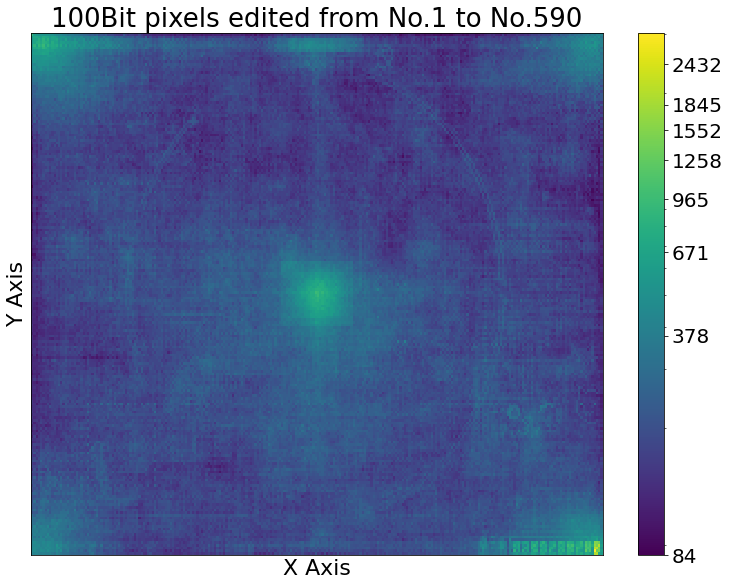

In [15]:
if (len(userFilter) == 0):
    plotHeatMap(pixel_counts2D, title="100Bit pixels edited from No." + str(args["start"]) + " to No." + str(args["end"]))
else:
    plotHeatMap(pixel_counts2D, title="100Bit pixels edited from No." + str(firstOccurence) + " to No." + str(lastOccurence) + " for user(s): " + ', '.join(userFilter))

As previously mentioned, I created two different types of heatmap, where the second one being a heatmap to display the average color of pixels. The Average Color heatmaps become very messy when using a large range of No.s, like a smeared charcoal drawing. I was initially considering leaving the colorbar off of these heatmaps, but I changed my mind when I found out that leaving it on makes it the same size as the change heatmaps, not to mention that it's useful for telling what the highest/lowest color percentages were.
### Q: What are those weird grid mark patterns all over the drawing?
#### A: Those are why I mentioned the "Noise Clear" tool from earlier!
Specifically, because the tool makes it very easy to clear out stray pixels, some players take advantage of this by purposefully leaving gaps in their drawing in the hopes that other players will use Noise Clear to fill them in. Usually, players will chop up drawings into stray pixels if they want something quickly erased, or they will draw around some pixels to be quickly filled in. In other words, the Noise Clear tool is likely why the heatmap below has a sort of burlap sack texture.

Some other interesting observations:
- The date counter in the bottom right is by far the most visible drawing in this heatmap.
- Top-left features the faint outline of the Brazilian flag, followed by the Canadian flag. These are from when 100bit was covered in assorted country flags, as seen here: https://danball.fandom.com/wiki/100bit?file=100bit_Flags.png
- Top-right features a repeating "+" pattern.
- The circle is still visible in this heatmap, albeit it is easier to see in the change heatmap.

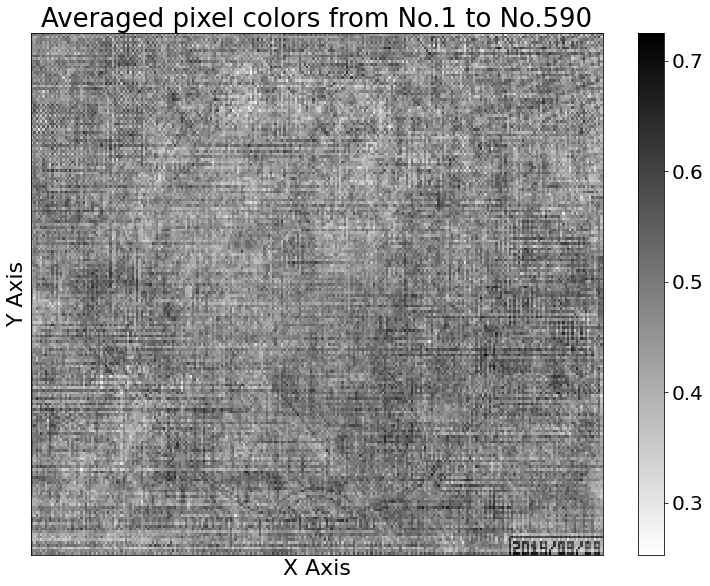

In [16]:
if (len(userFilter) == 0):
    plotHeatMap(pixelAverages2D, title="Averaged pixel colors from No." + str(args["start"]) + " to No." + str(args["end"]), blackAndWhite = True)
else:
    plotHeatMap(pixelAverages2D, title="Averaged pixel colors from No." + str(args["start"]) + " to No." + str(args["end"])+ " for user(s): " + ', '.join(userFilter), blackAndWhite = True)

Here, I made some functions to display heatmaps for a limited range of random No.s. 

Getting heatmaps from No.273 to No.382...

Getting average color of pixels...
Finished, total edits: 21953
Getting number of changes for each pixel...
Total pixels edited: 1992161
Mean edits per pixel: 40.530619303385414
Pixels sorted by # of times edited:
x252   y190  :   1031
x253   y189  :    616
x253   y191  :    616
x254   y188  :    613
x252   y191  :    594
x252   y189  :    580
x253   y190  :    430
x253   y188  :    402
x252   y188  :    401
x253   y187  :    392
Least popular pixel was at: x0 y53 with 4 edits.


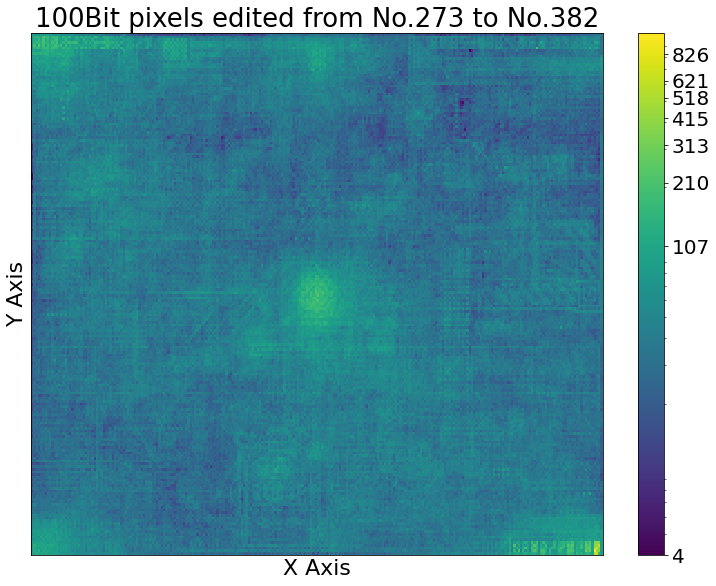

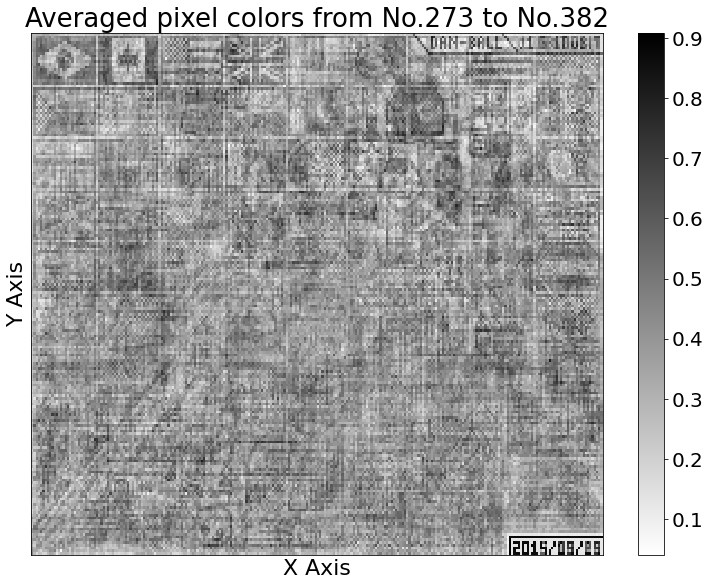

In [17]:
import random as r # Referenced from: https://docs.python.org/3/library/random.html
randomStart = r.randrange(args["start"], args["end"] + 1)
randomEnd = r.randrange(args["start"], args["end"] + 1)
if (randomStart > randomEnd):
    temp = randomStart
    randomStart = randomEnd
    randomEnd = temp
print("Getting heatmaps from No." + str(randomStart) + " to No." + str(randomEnd) + "...\n")
pixelAverages2D = getPixelColorAverages(wb, randomStart, randomEnd)
pixel_counts2D, firstOccurence, lastOccurence = getPixelsByPopularity(wb, randomStart, randomEnd)
plotHeatMap(pixel_counts2D, title="100Bit pixels edited from No." + str(randomStart) + " to No." + str(randomEnd))
plotHeatMap(pixelAverages2D, title="Averaged pixel colors from No." + str(randomStart) + " to No." + str(randomEnd), blackAndWhite = True)

Here is some code to display several heatmaps from different intervals. This code might take a while to run depending on how small spacing is.

Getting average color of pixels...
Finished, total edits: 4056
Getting number of changes for each pixel...
Total pixels edited: 232601
Mean edits per pixel: 4.732279459635417
Pixels sorted by # of times edited:
x0     y0    :    109
x120   y4    :     52
x124   y4    :     46
x134   y5    :     45
x122   y6    :     44
x127   y4    :     41
x134   y4    :     41
x122   y3    :     40
x131   y4    :     40
x135   y4    :     40
Least popular pixel was at: x154 y191 with 1 edits.


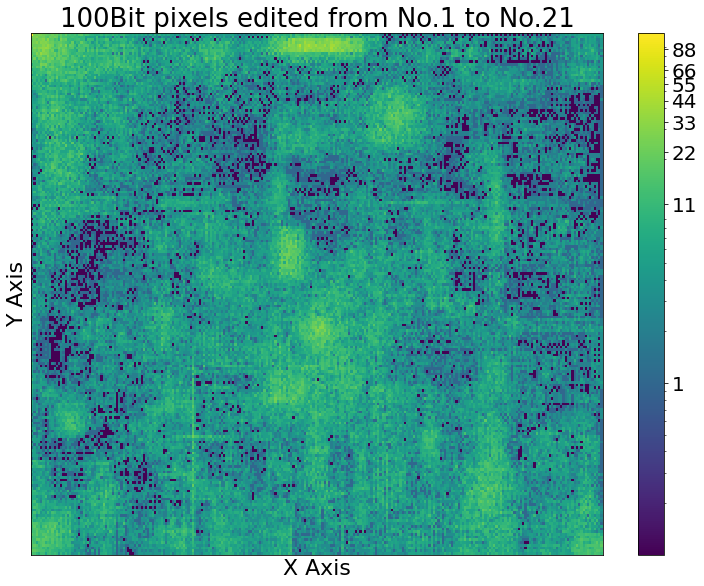

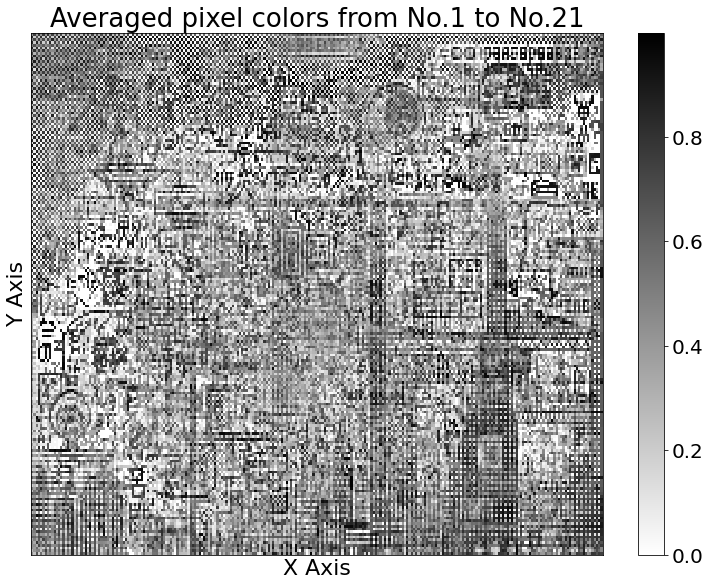

Getting average color of pixels...
Finished, total edits: 4105
Getting number of changes for each pixel...
Total pixels edited: 262964
Mean edits per pixel: 5.350016276041667
Pixels sorted by # of times edited:
x0     y0    :     72
x11    y188  :     56
x4     y190  :     52
x1     y190  :     50
x3     y189  :     49
x10    y189  :     49
x3     y188  :     48
x14    y188  :     48
x5     y190  :     48
x9     y187  :     47
Least popular pixel was at: x206 y191 with 1 edits.


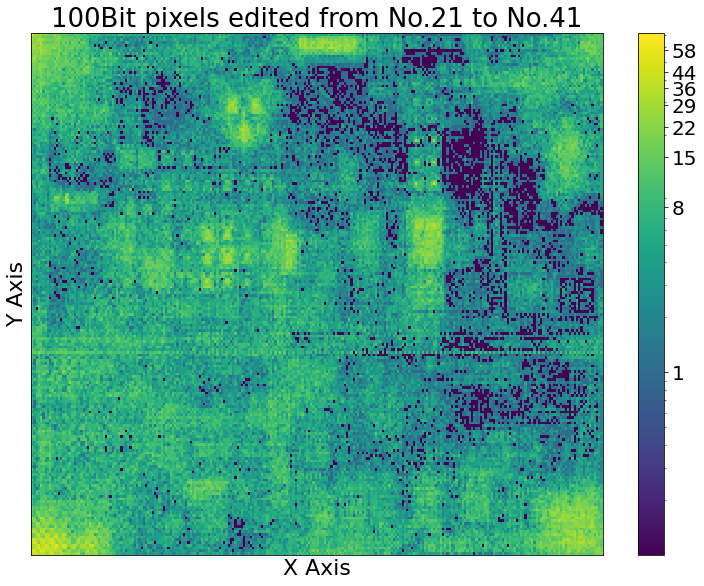

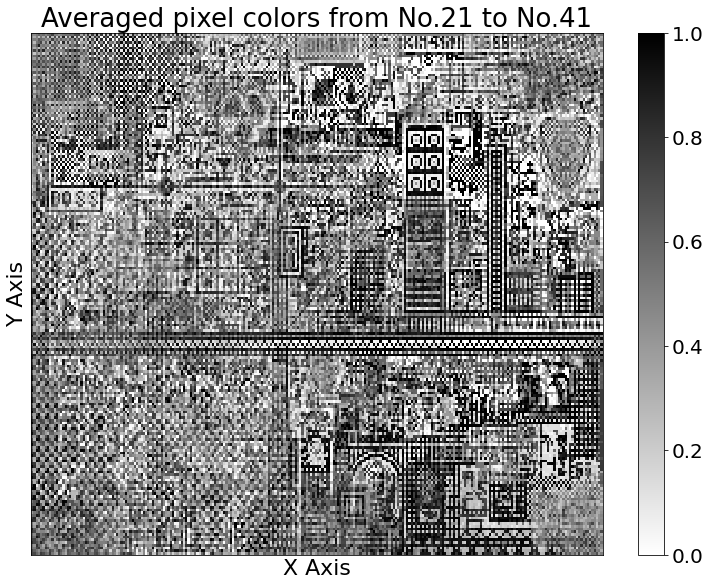

Getting average color of pixels...
Finished, total edits: 4137
Getting number of changes for each pixel...
Total pixels edited: 287025
Mean edits per pixel: 5.83953857421875
Pixels sorted by # of times edited:
x214   y37   :     58
x214   y38   :     57
x213   y78   :     57
x215   y39   :     54
x217   y39   :     54
x124   y4    :     53
x216   y38   :     53
x215   y80   :     52
x111   y56   :     50
x214   y79   :     50
Least popular pixel was at: x216 y191 with 1 edits.


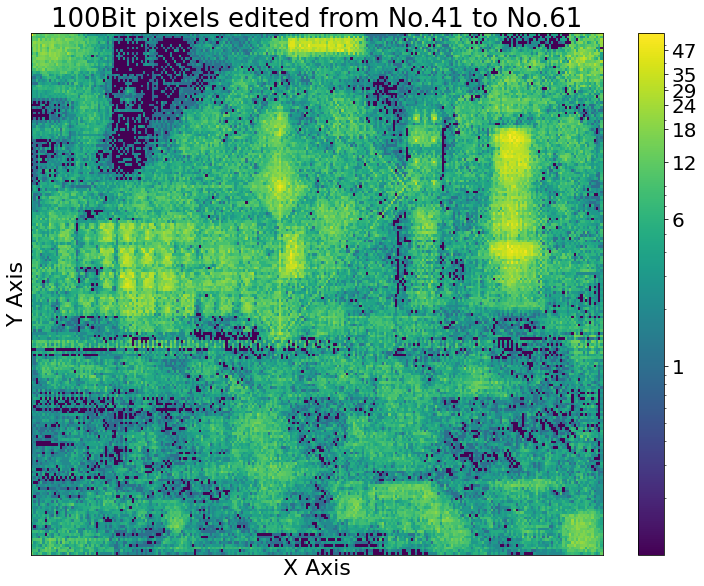

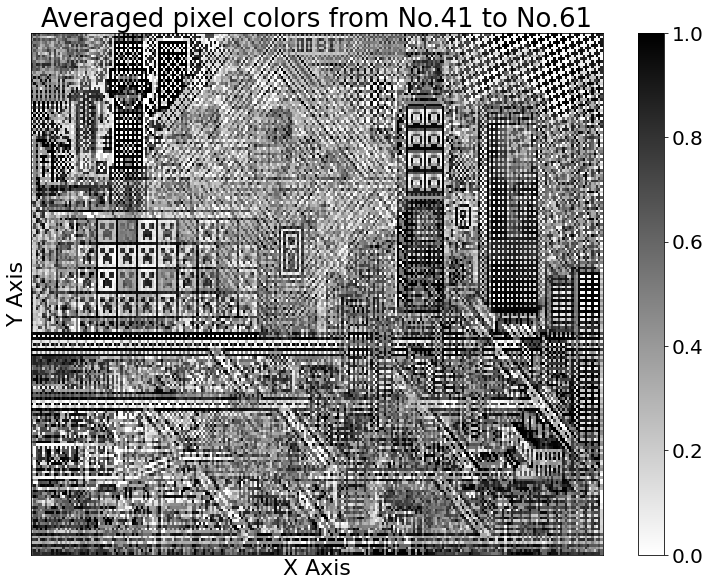

Getting average color of pixels...
Finished, total edits: 4167
Getting number of changes for each pixel...
Total pixels edited: 319662
Mean edits per pixel: 6.5035400390625
Pixels sorted by # of times edited:
x124   y98   :     61
x124   y94   :     57
x128   y101  :     56
x125   y99   :     55
x124   y97   :     54
x124   y92   :     53
x121   y97   :     51
x124   y95   :     50
x126   y98   :     50
x131   y101  :     50
Least popular pixel was at: x202 y191 with 1 edits.


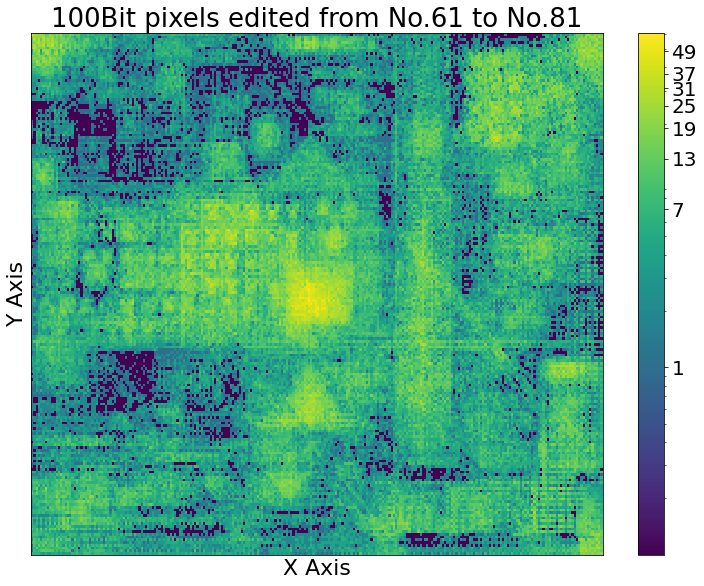

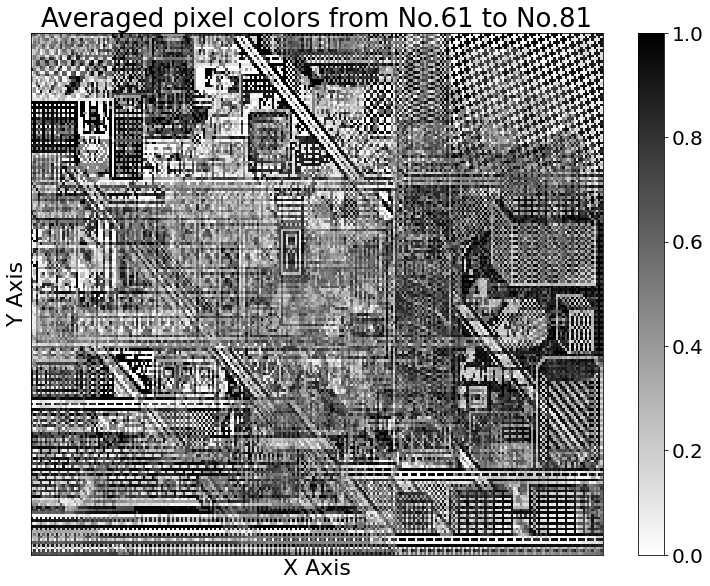

Getting average color of pixels...
Finished, total edits: 4173
Getting number of changes for each pixel...
Total pixels edited: 347893
Mean edits per pixel: 7.077901204427083
Pixels sorted by # of times edited:
x0     y0    :     66
x127   y94   :     61
x128   y94   :     61
x128   y93   :     60
x129   y96   :     58
x128   y92   :     57
x130   y93   :     57
x131   y94   :     57
x128   y95   :     57
x250   y1    :     56
Least popular pixel was at: x161 y191 with 1 edits.


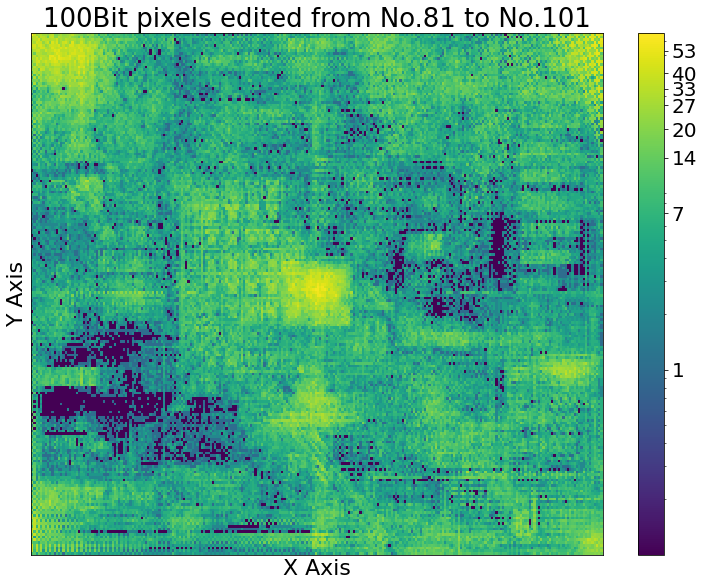

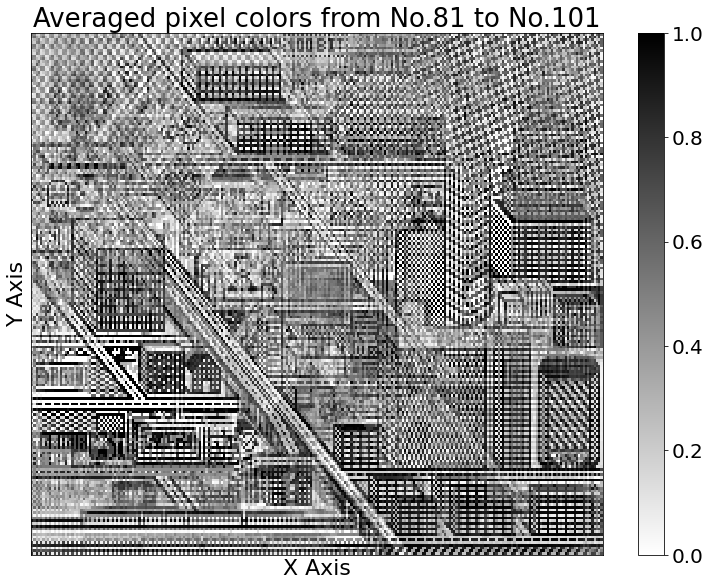

Getting average color of pixels...
Finished, total edits: 4168
Getting number of changes for each pixel...
Total pixels edited: 346795
Mean edits per pixel: 7.055562337239583
Pixels sorted by # of times edited:
x124   y96   :     70
x128   y95   :     67
x125   y97   :     64
x0     y0    :     63
x125   y96   :     63
x125   y91   :     62
x128   y96   :     61
x4     y4    :     60
x126   y94   :     60
x136   y94   :     60
Least popular pixel was at: x60 y191 with 1 edits.


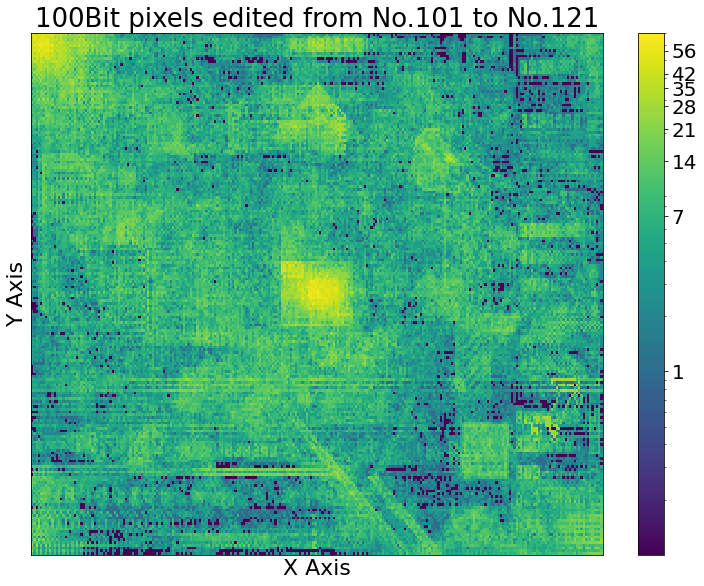

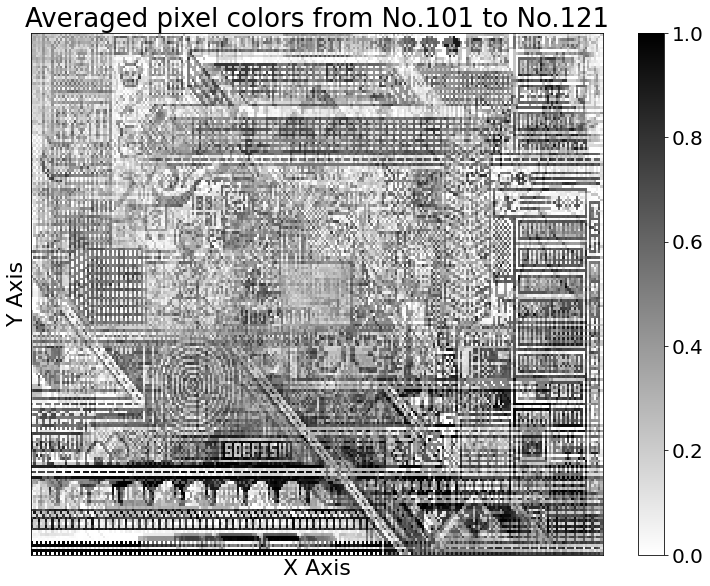

Getting average color of pixels...
Finished, total edits: 4164
Getting number of changes for each pixel...
Total pixels edited: 325734
Mean edits per pixel: 6.6270751953125
Pixels sorted by # of times edited:
x130   y92   :     60
x131   y94   :     60
x129   y97   :     60
x131   y98   :     60
x132   y95   :     59
x131   y96   :     59
x132   y97   :     59
x129   y88   :     58
x130   y91   :     57
x127   y94   :     57
Least popular pixel was at: x146 y191 with 1 edits.


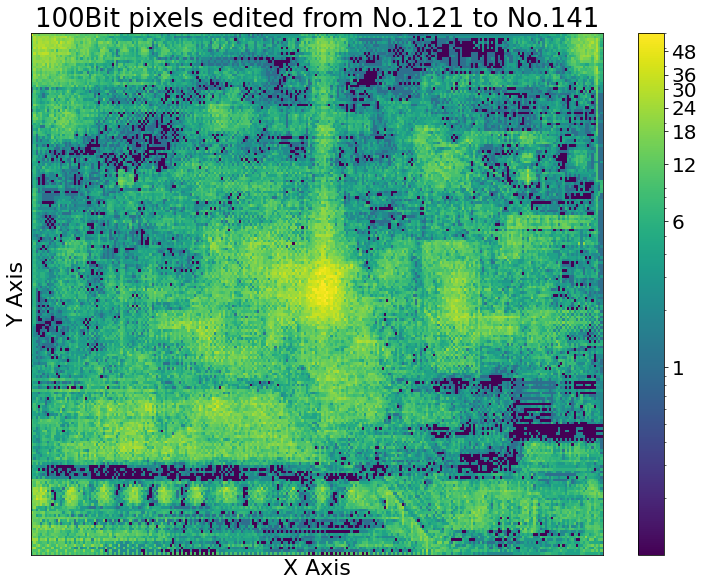

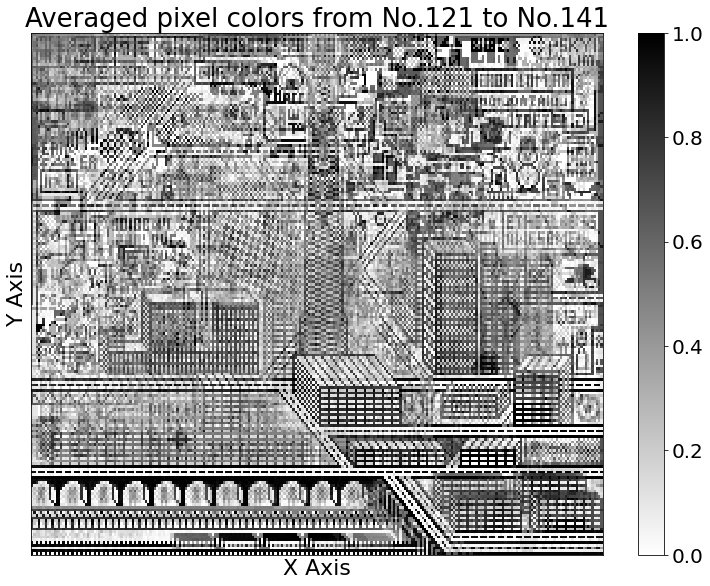

Getting average color of pixels...
Finished, total edits: 4177
Getting number of changes for each pixel...
Total pixels edited: 342894
Mean edits per pixel: 6.9761962890625
Pixels sorted by # of times edited:
x137   y88   :     63
x128   y98   :     61
x138   y88   :     59
x127   y104  :     57
x129   y96   :     56
x130   y101  :     56
x132   y102  :     56
x129   y103  :     56
x132   y95   :     55
x129   y102  :     55
Least popular pixel was at: x126 y187 with 1 edits.


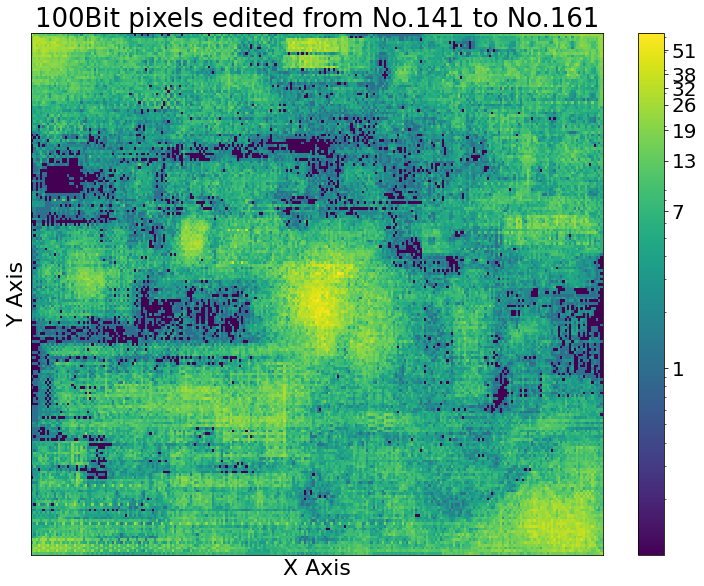

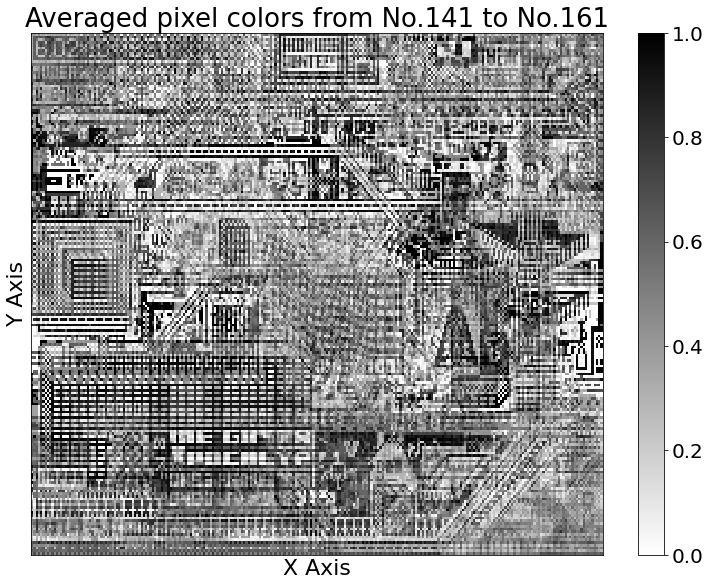

Getting average color of pixels...
Finished, total edits: 4184
Getting number of changes for each pixel...
Total pixels edited: 348016
Mean edits per pixel: 7.080403645833333
Pixels sorted by # of times edited:
x164   y113  :    163
x167   y113  :    157
x155   y104  :    119
x155   y94   :    105
x167   y92   :    103
x164   y92   :     97
x144   y144  :     69
x150   y66   :     63
x149   y95   :     62
x141   y146  :     62
Least popular pixel was at: x209 y191 with 1 edits.


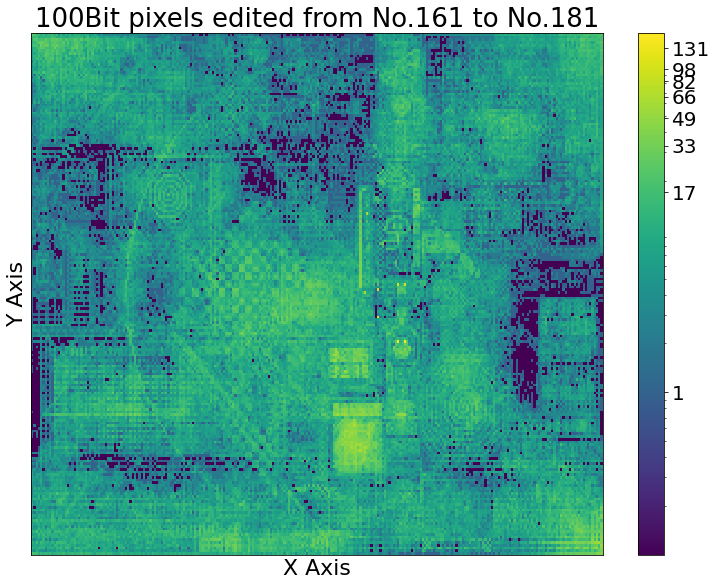

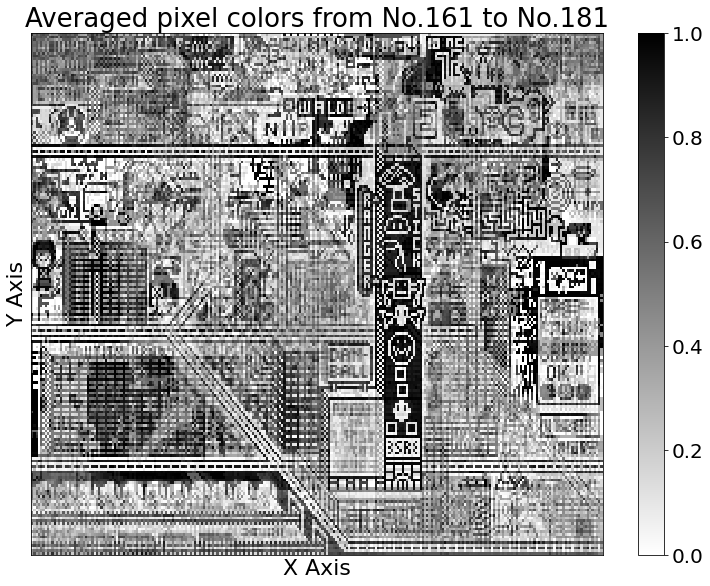

Getting average color of pixels...
Finished, total edits: 4186
Getting number of changes for each pixel...
Total pixels edited: 360289
Mean edits per pixel: 7.330098470052083
Pixels sorted by # of times edited:
x127   y95   :    111
x128   y94   :     87
x128   y96   :     86
x125   y93   :     83
x128   y95   :     82
x127   y94   :     81
x127   y97   :     81
x124   y94   :     79
x127   y96   :     79
x127   y93   :     78
Least popular pixel was at: x215 y191 with 1 edits.


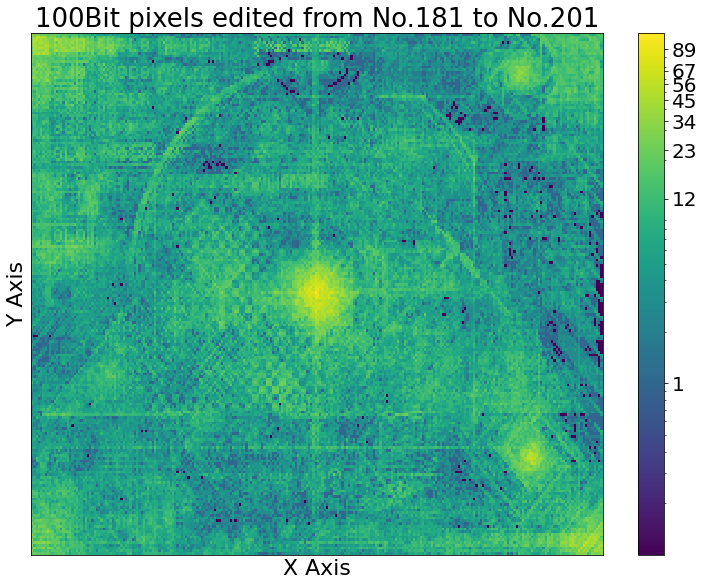

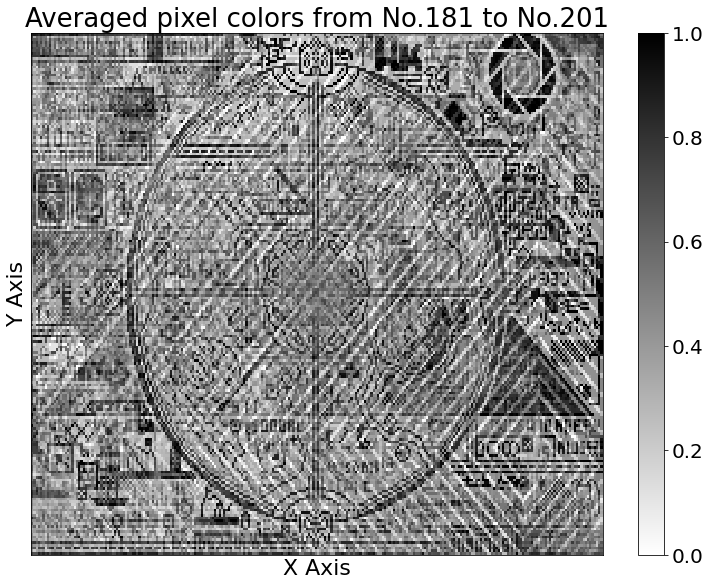

Getting average color of pixels...
Finished, total edits: 4181
Getting number of changes for each pixel...
Total pixels edited: 354847
Mean edits per pixel: 7.219380696614583
Pixels sorted by # of times edited:
x238   y190  :    257
x229   y187  :    253
x232   y190  :    250
x244   y190  :    250
x226   y190  :    249
x242   y188  :    247
x224   y189  :    245
x222   y190  :    241
x216   y190  :    240
x222   y188  :    237
Least popular pixel was at: x197 y191 with 1 edits.


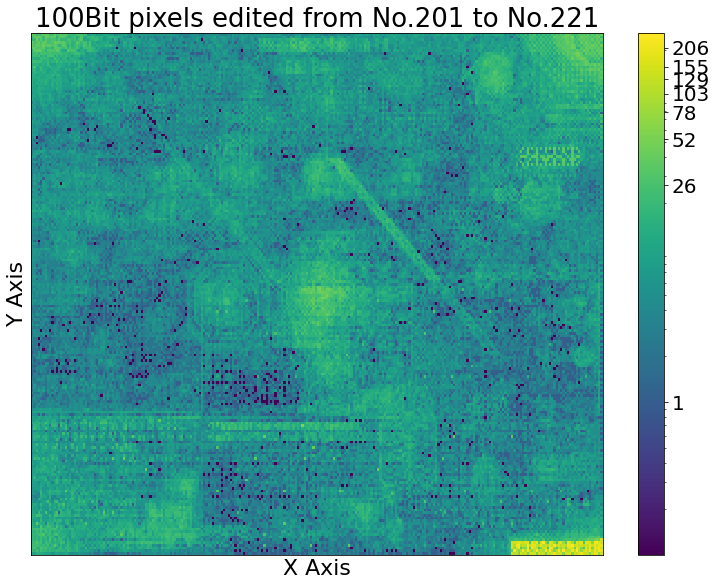

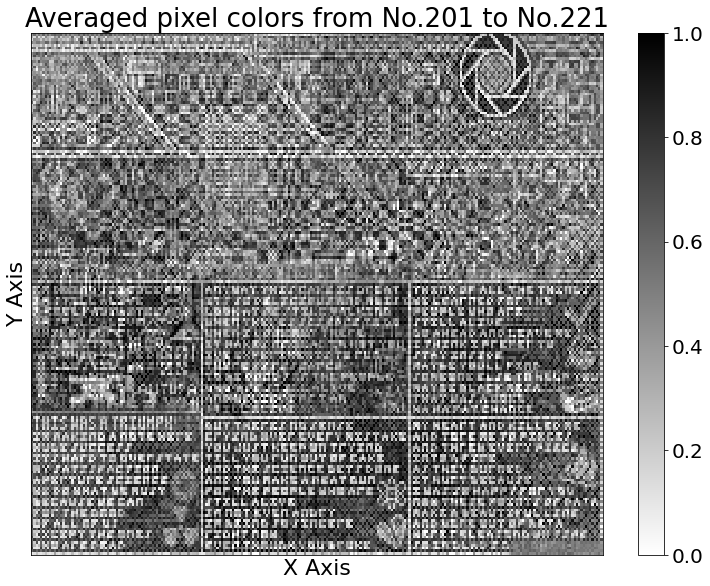

Getting average color of pixels...
Finished, total edits: 4184
Getting number of changes for each pixel...
Total pixels edited: 366194
Mean edits per pixel: 7.450236002604167
Pixels sorted by # of times edited:
x252   y190  :    173
x252   y189  :    148
x254   y188  :    142
x252   y188  :    132
x252   y191  :    125
x253   y189  :    124
x253   y191  :    123
x254   y187  :    120
x254   y190  :    120
x254   y189  :    118
Least popular pixel was at: x199 y191 with 1 edits.


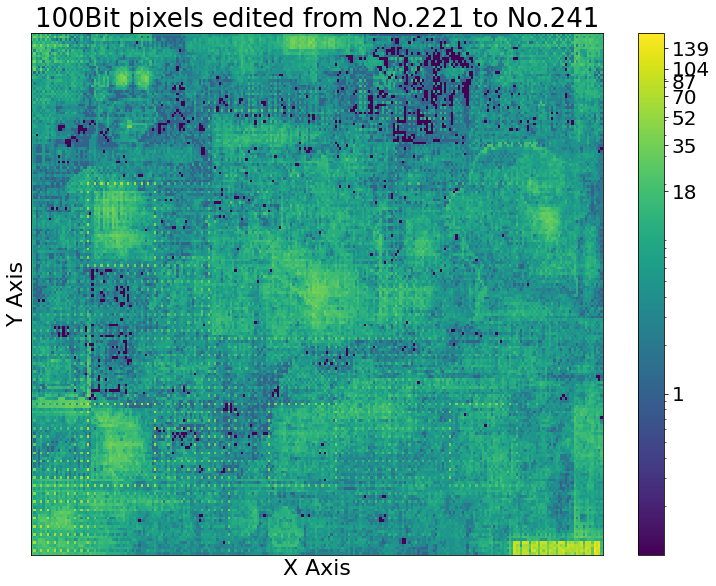

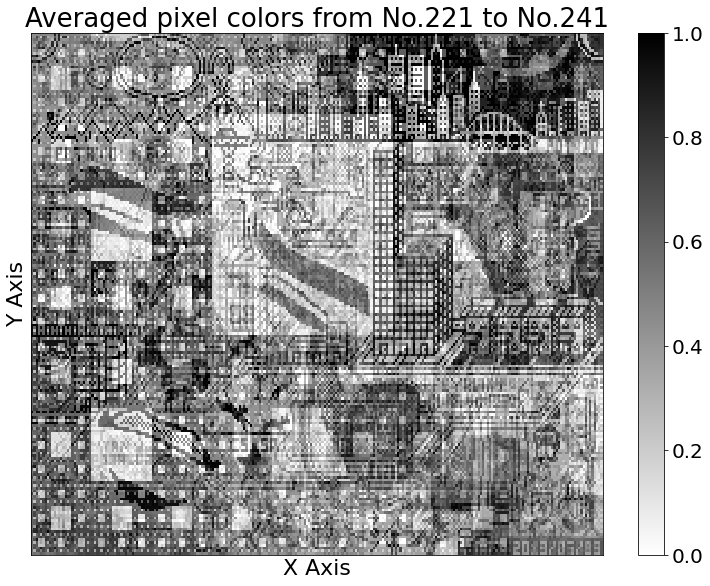

Getting average color of pixels...
Finished, total edits: 4181
Getting number of changes for each pixel...
Total pixels edited: 363029
Mean edits per pixel: 7.385843912760417
Pixels sorted by # of times edited:
x252   y190  :    219
x254   y188  :    144
x252   y191  :    136
x253   y191  :    126
x253   y189  :    124
x252   y189  :    118
x252   y188  :     90
x253   y187  :     88
x1     y4    :     85
x253   y190  :     84
Least popular pixel was at: x184 y191 with 1 edits.


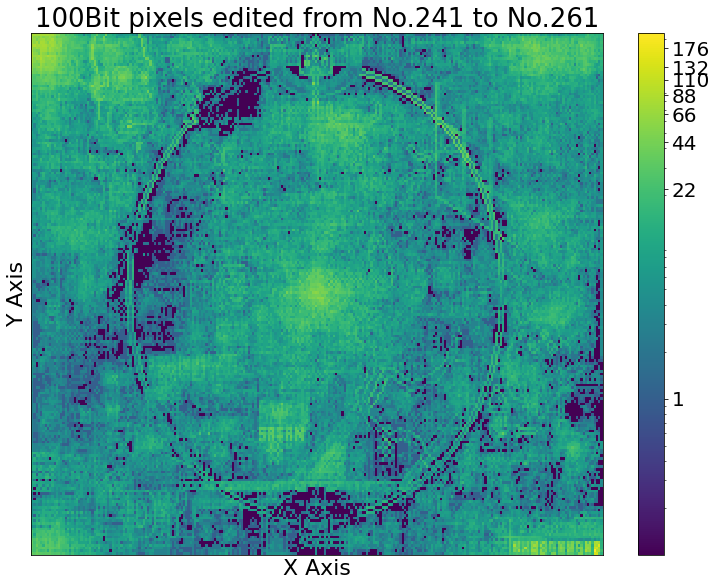

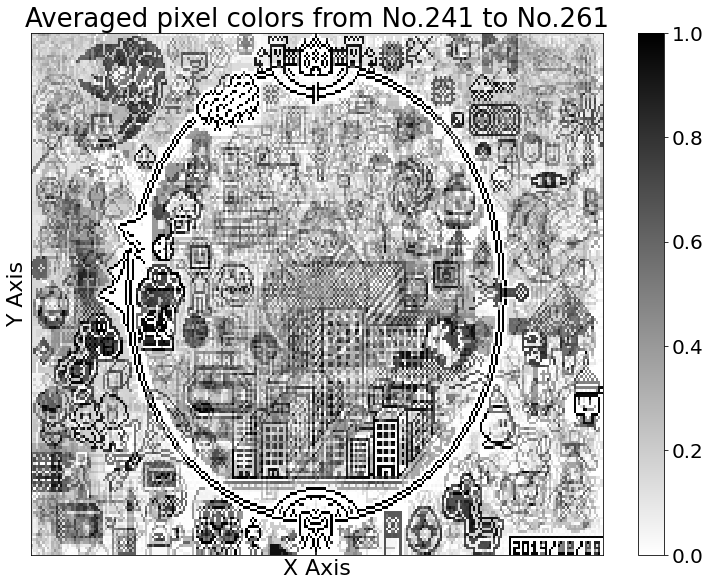

Getting average color of pixels...
Finished, total edits: 4191
Getting number of changes for each pixel...
Total pixels edited: 378781
Mean edits per pixel: 7.706319173177083
Pixels sorted by # of times edited:
x252   y190  :    155
x254   y188  :    116
x252   y191  :    105
x253   y191  :    105
x252   y189  :    102
x253   y189  :     99
x253   y187  :     83
x252   y187  :     78
x253   y188  :     78
x254   y189  :     76
Least popular pixel was at: x140 y191 with 1 edits.


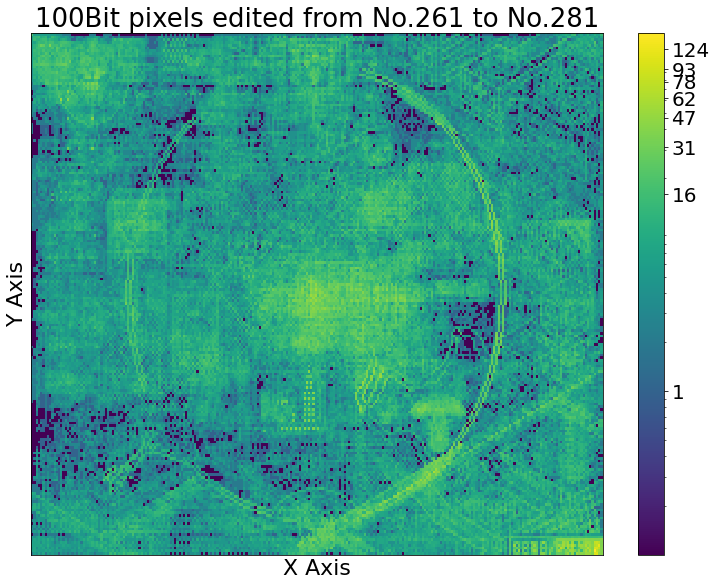

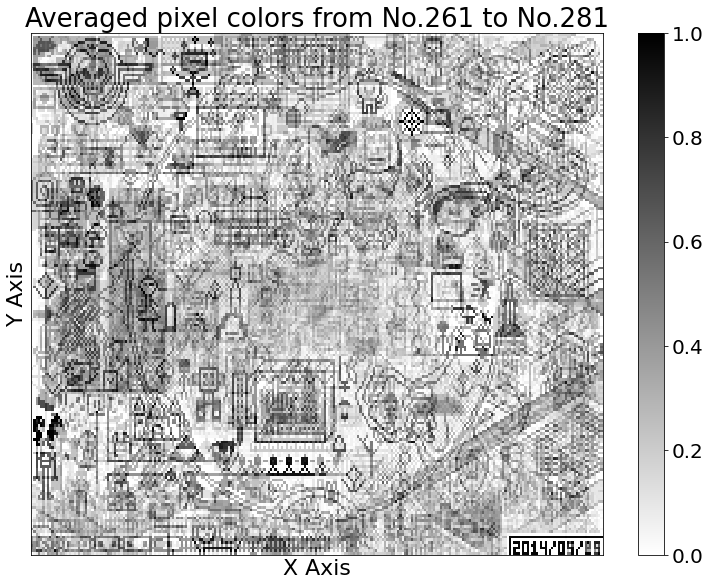

Getting average color of pixels...
Finished, total edits: 4193
Getting number of changes for each pixel...
Total pixels edited: 386528
Mean edits per pixel: 7.863932291666667
Pixels sorted by # of times edited:
x252   y190  :    134
x253   y191  :     79
x60    y3    :     77
x252   y191  :     73
x129   y13   :     72
x253   y189  :     72
x59    y8    :     71
x254   y188  :     70
x69    y8    :     67
x252   y189  :     66
Least popular pixel was at: x85 y190 with 1 edits.


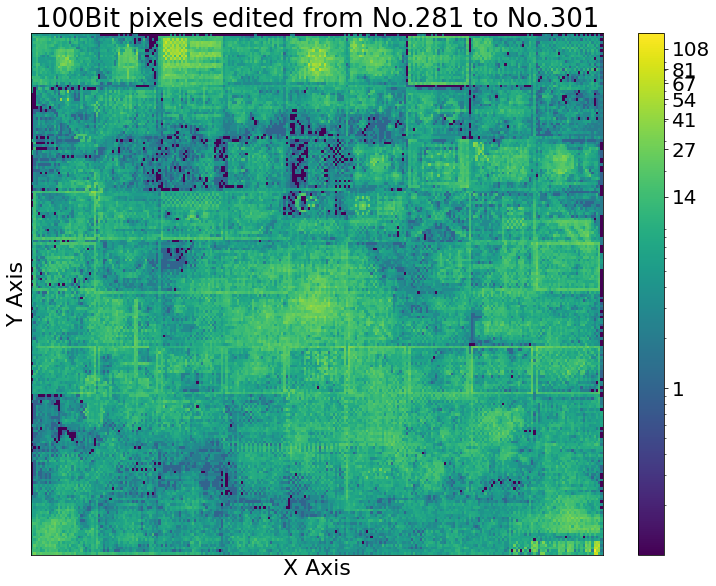

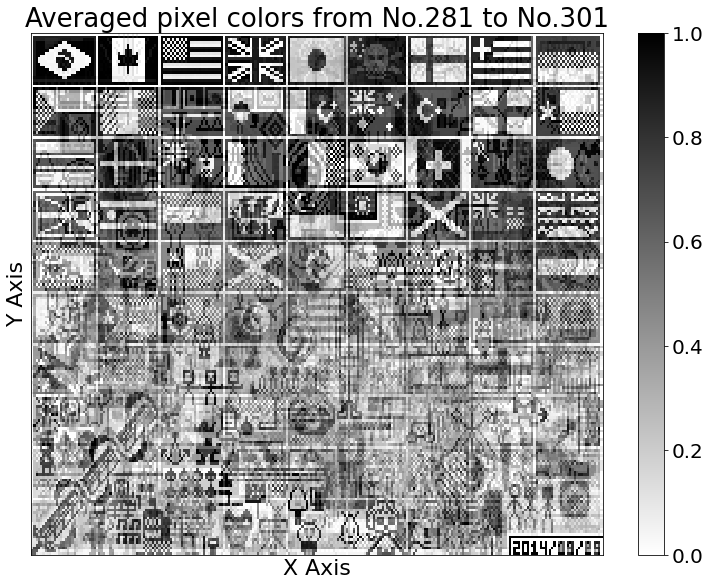

Getting average color of pixels...
Finished, total edits: 4189
Getting number of changes for each pixel...
Total pixels edited: 390310
Mean edits per pixel: 7.940877278645833
Pixels sorted by # of times edited:
x252   y190  :    194
x253   y191  :    116
x252   y191  :    112
x253   y189  :    110
x254   y188  :    108
x252   y189  :    102
x126   y92   :     80
x129   y92   :     80
x225   y188  :     80
x252   y188  :     77
Least popular pixel was at: x121 y191 with 1 edits.


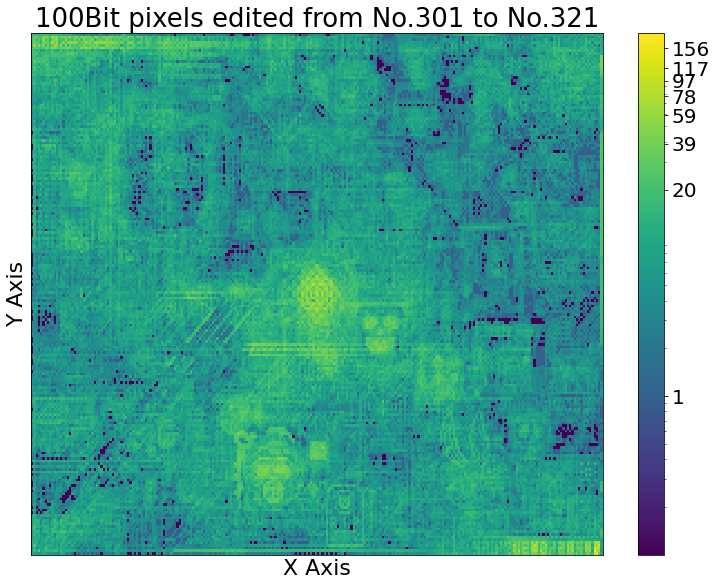

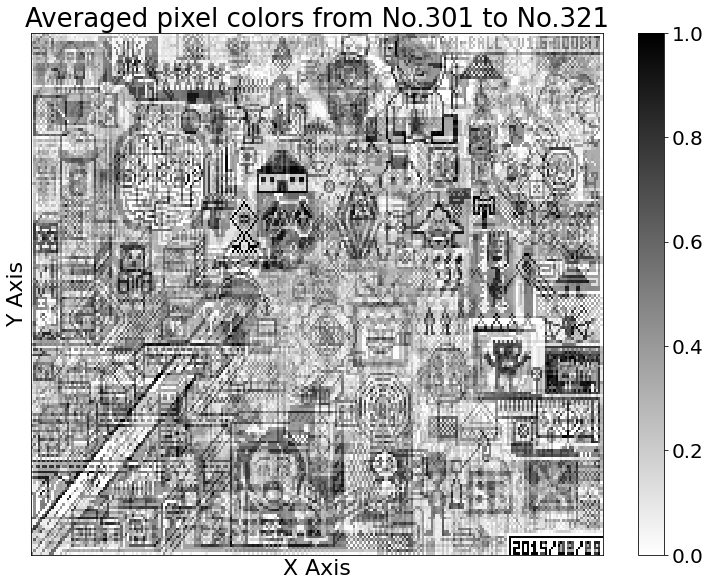

Getting average color of pixels...
Finished, total edits: 4195
Getting number of changes for each pixel...
Total pixels edited: 378733
Mean edits per pixel: 7.705342610677083
Pixels sorted by # of times edited:
x252   y190  :    231
x226   y5    :    183
x253   y189  :    144
x254   y188  :    139
x253   y191  :    136
x3     y4    :    135
x252   y191  :    130
x252   y189  :    129
x5     y1    :    115
x5     y4    :    111
Least popular pixel was at: x128 y191 with 1 edits.


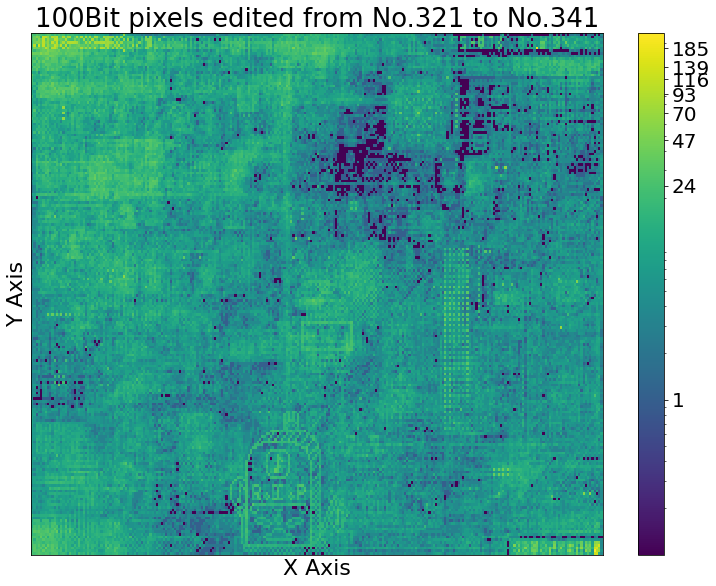

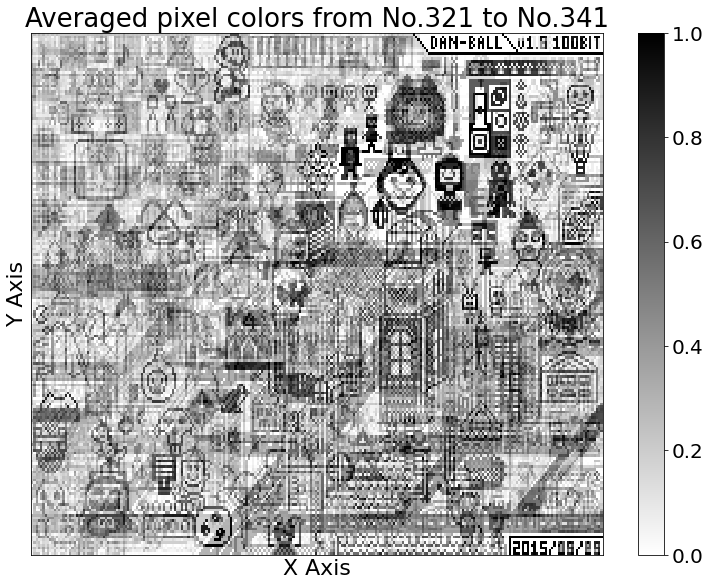

Getting average color of pixels...
Finished, total edits: 4189
Getting number of changes for each pixel...
Total pixels edited: 368147
Mean edits per pixel: 7.489969889322917
Pixels sorted by # of times edited:
x252   y190  :    247
x254   y188  :    150
x252   y189  :    145
x253   y191  :    145
x253   y189  :    143
x252   y191  :    139
x252   y188  :    102
x229   y190  :     96
x254   y190  :     95
x253   y190  :     94
Least popular pixel was at: x113 y190 with 1 edits.


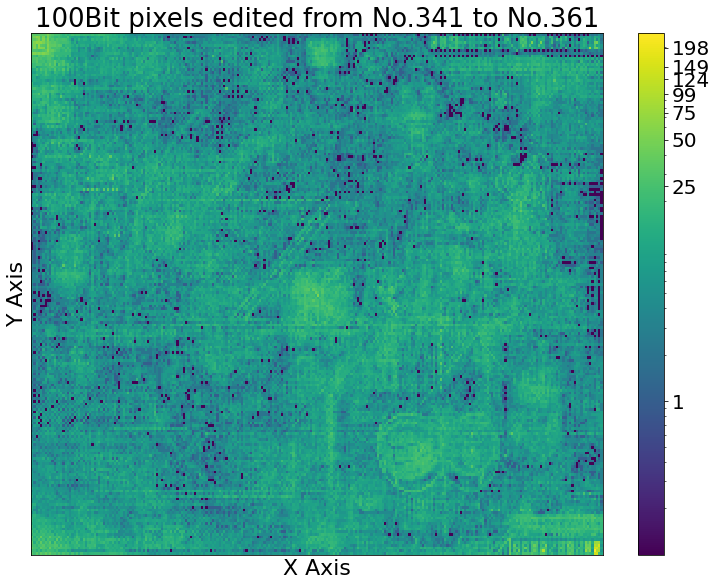

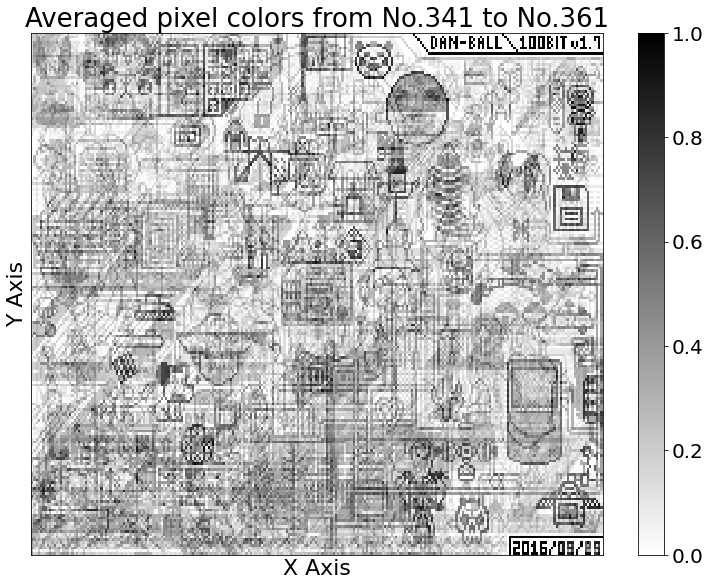

Getting average color of pixels...
Finished, total edits: 4195
Getting number of changes for each pixel...
Total pixels edited: 380295
Mean edits per pixel: 7.73712158203125
Pixels sorted by # of times edited:
x252   y190  :    173
x253   y189  :    116
x253   y191  :    110
x252   y189  :    108
x252   y191  :    108
x254   y188  :    107
x253   y190  :     96
x252   y188  :     83
x252   y187  :     82
x253   y187  :     80
Least popular pixel was at: x185 y188 with 1 edits.


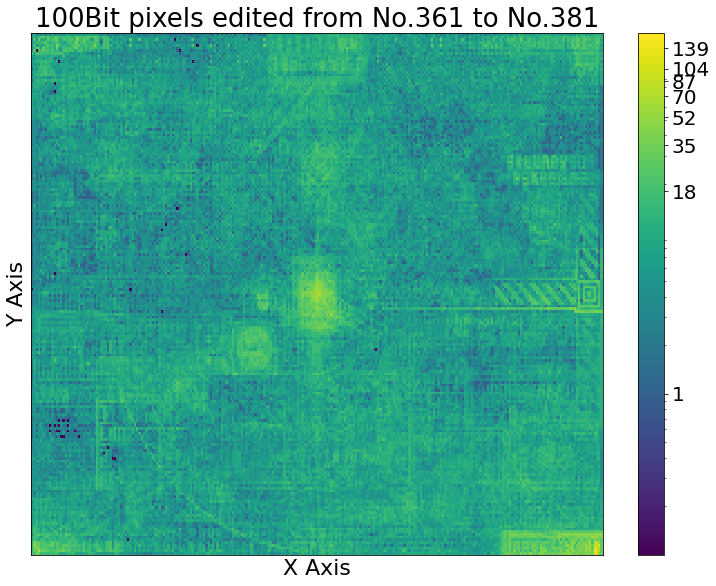

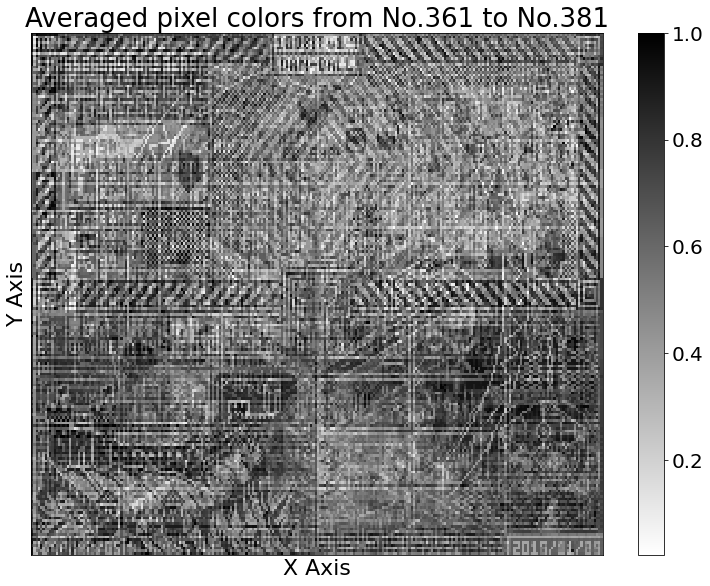

Getting average color of pixels...
Finished, total edits: 4197
Getting number of changes for each pixel...
Total pixels edited: 393701
Mean edits per pixel: 8.009867350260416
Pixels sorted by # of times edited:
x252   y190  :    185
x217   y173  :    109
x254   y188  :    107
x252   y189  :     99
x252   y191  :     97
x253   y191  :     97
x253   y189  :     95
x5     y4    :     76
x252   y188  :     65
x254   y190  :     63
Least popular pixel was at: x170 y189 with 1 edits.


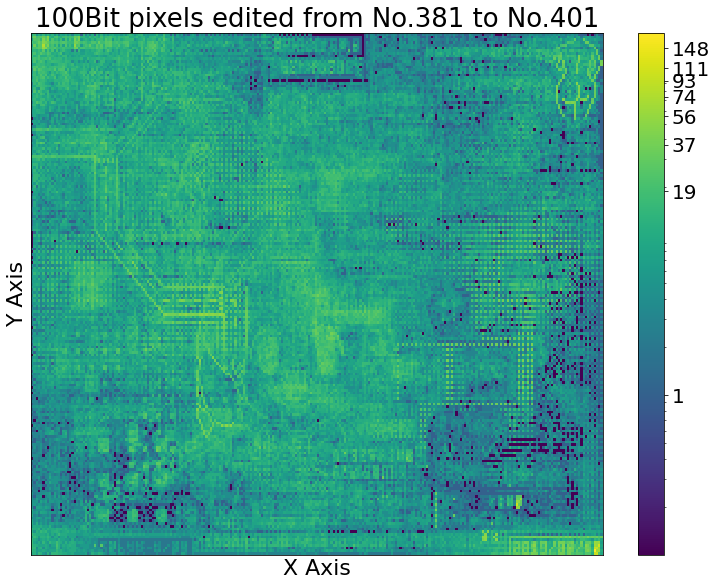

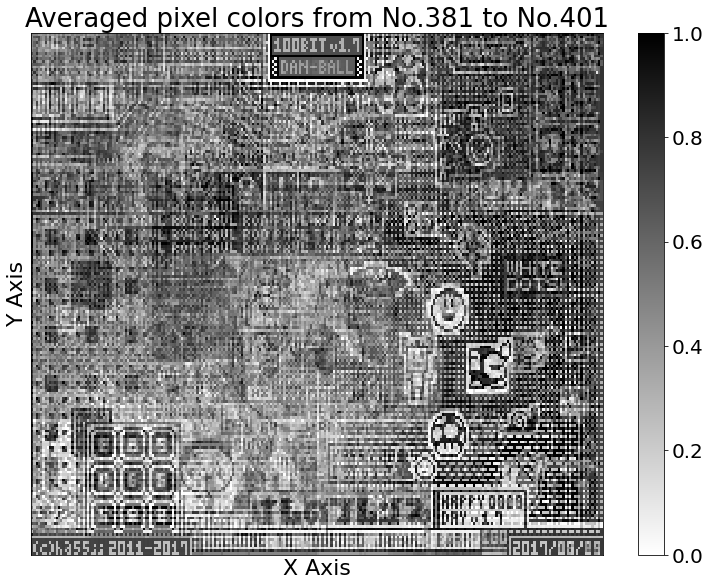

Getting average color of pixels...
Finished, total edits: 4199
Getting number of changes for each pixel...
Total pixels edited: 383889
Mean edits per pixel: 7.81024169921875
Pixels sorted by # of times edited:
x252   y190  :    219
x252   y189  :    129
x254   y188  :    126
x253   y191  :    125
x252   y191  :    123
x253   y189  :    118
x252   y188  :    109
x235   y141  :     80
x224   y148  :     80
x254   y190  :     75
Least popular pixel was at: x235 y191 with 1 edits.


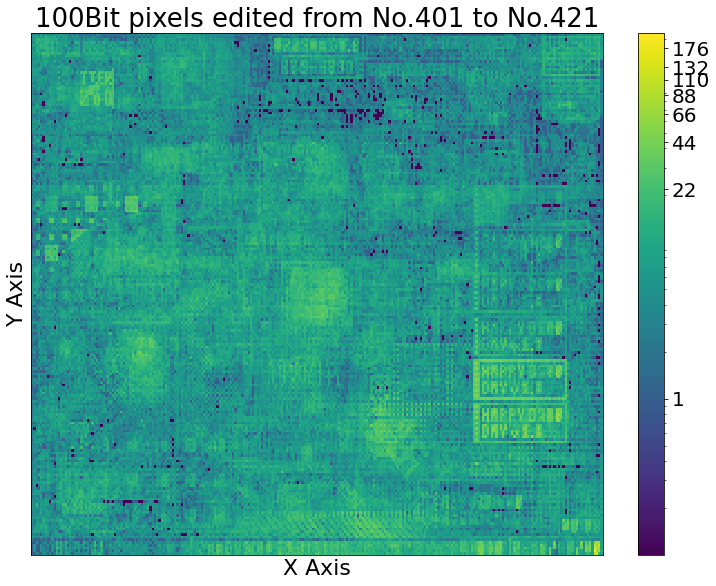

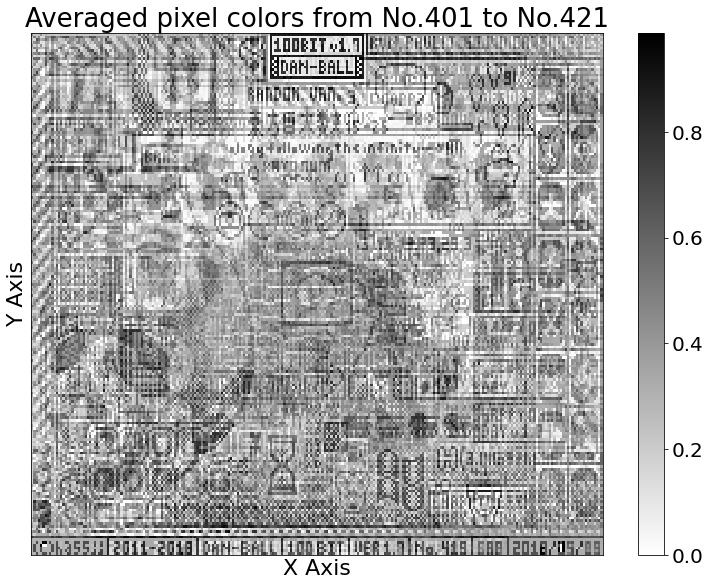

Getting average color of pixels...
Finished, total edits: 4198
Getting number of changes for each pixel...
Total pixels edited: 391860
Mean edits per pixel: 7.972412109375
Pixels sorted by # of times edited:
x252   y190  :    123
x252   y191  :    103
x252   y189  :     97
x254   y188  :     95
x253   y191  :     95
x253   y189  :     86
x29    y9    :     85
x38    y10   :     83
x51    y11   :     83
x229   y188  :     83
Least popular pixel was at: x133 y191 with 1 edits.


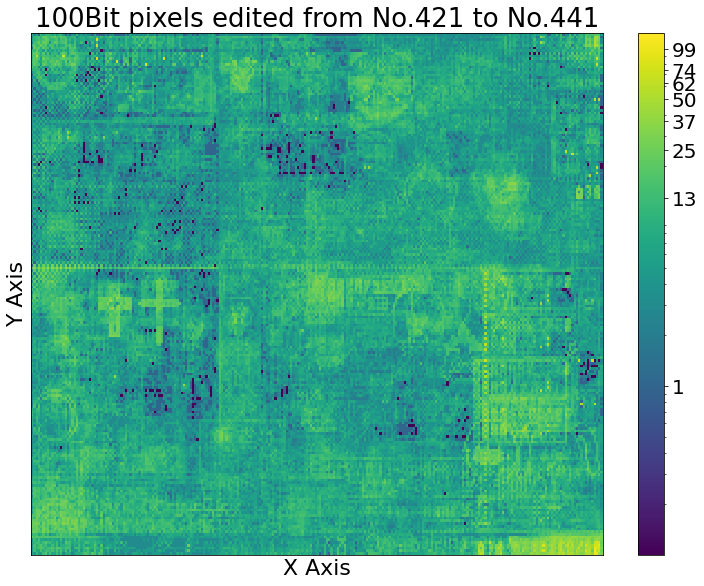

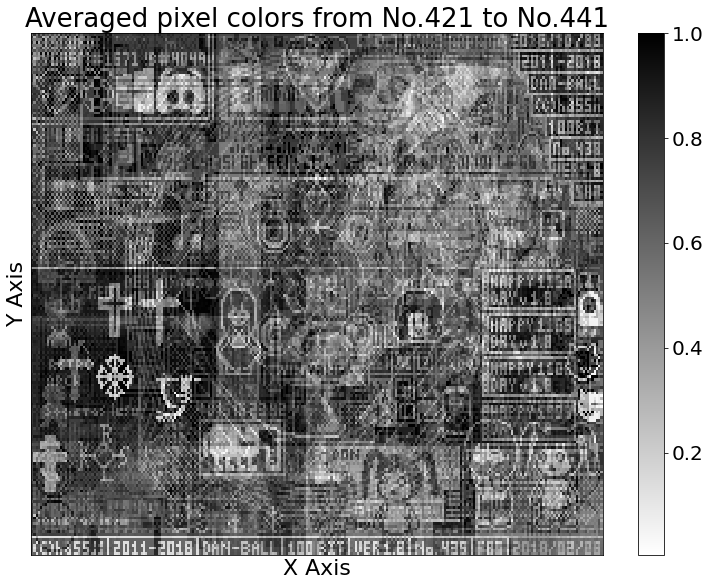

Getting average color of pixels...
Finished, total edits: 4198
Getting number of changes for each pixel...
Total pixels edited: 403538
Mean edits per pixel: 8.210001627604166
Pixels sorted by # of times edited:
x252   y190  :    109
x252   y189  :     90
x252   y191  :     86
x253   y191  :     80
x253   y189  :     79
x254   y188  :     76
x254   y187  :     70
x246   y136  :     68
x229   y188  :     68
x252   y136  :     64
Least popular pixel was at: x123 y191 with 1 edits.


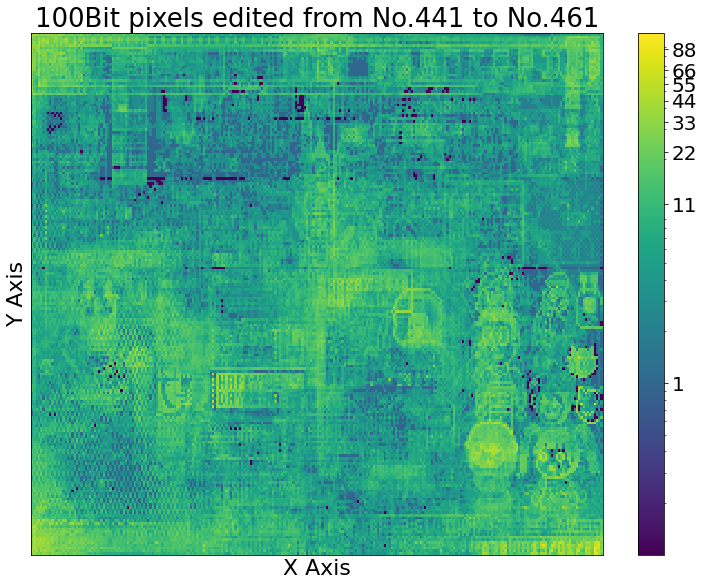

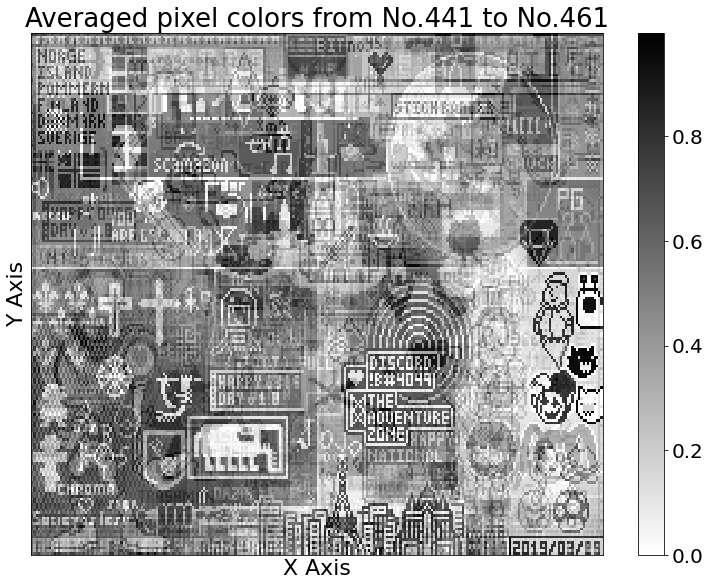

Getting average color of pixels...
Finished, total edits: 4193
Getting number of changes for each pixel...
Total pixels edited: 390860
Mean edits per pixel: 7.952067057291667
Pixels sorted by # of times edited:
x251   y188  :    112
x253   y186  :     91
x252   y187  :     90
x127   y96   :     74
x251   y187  :     73
x251   y189  :     71
x252   y189  :     66
x253   y188  :     65
x129   y100  :     62
x206   y185  :     62
Least popular pixel was at: x224 y191 with 1 edits.


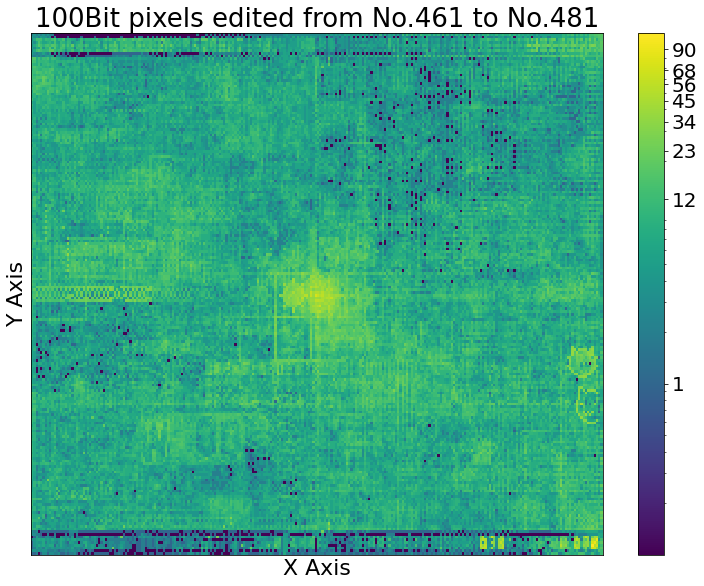

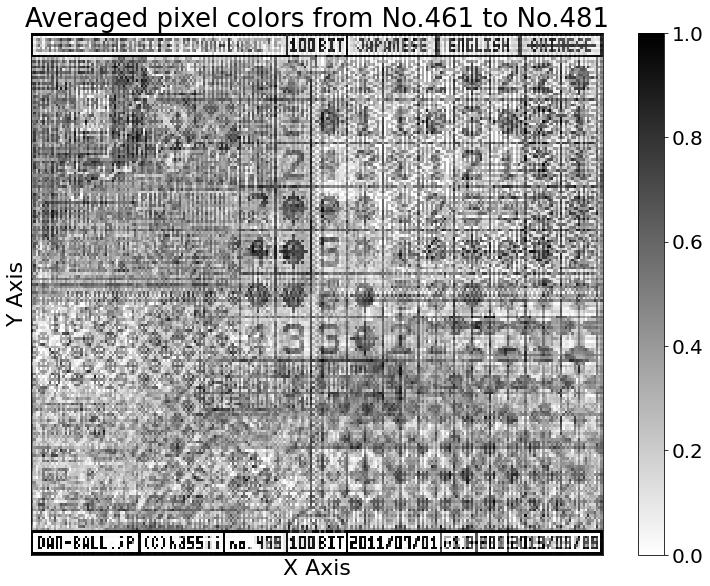

Getting average color of pixels...
Finished, total edits: 4196
Getting number of changes for each pixel...
Total pixels edited: 396769
Mean edits per pixel: 8.072285970052084
Pixels sorted by # of times edited:
x251   y188  :     92
x206   y185  :     80
x252   y189  :     80
x202   y189  :     74
x201   y188  :     72
x80    y124  :     71
x252   y187  :     70
x253   y186  :     69
x80    y122  :     68
x77    y120  :     64
Least popular pixel was at: x30 y181 with 1 edits.


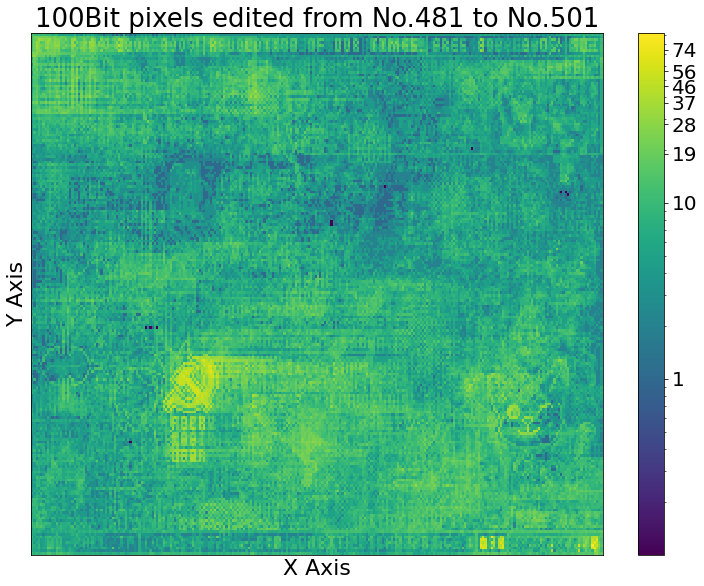

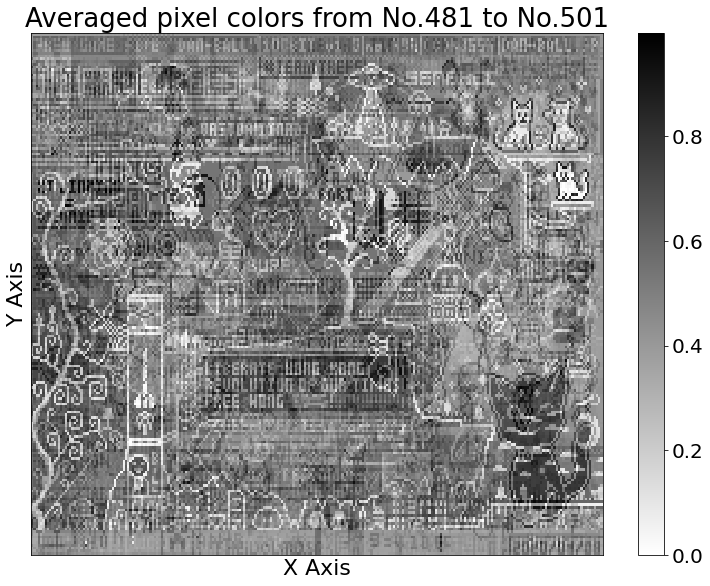

Getting average color of pixels...
Finished, total edits: 4196
Getting number of changes for each pixel...
Total pixels edited: 392119
Mean edits per pixel: 7.977681477864583
Pixels sorted by # of times edited:
x252   y190  :    120
x228   y137  :    118
x214   y139  :    114
x214   y140  :    114
x217   y141  :    114
x213   y140  :    113
x214   y138  :    112
x215   y141  :    112
x233   y137  :    111
x231   y136  :    110
Least popular pixel was at: x188 y191 with 1 edits.


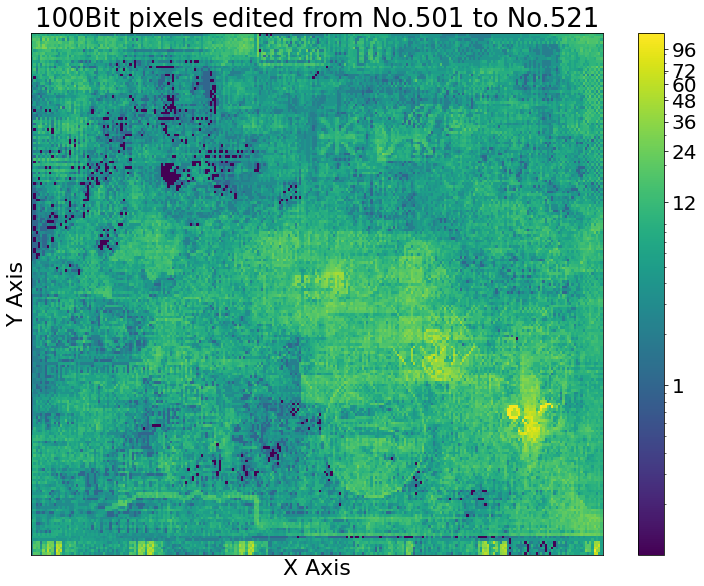

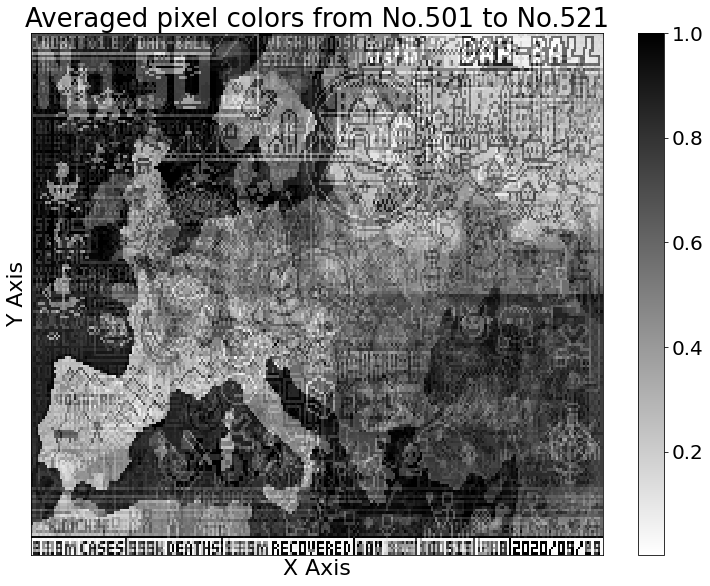

Getting average color of pixels...
Finished, total edits: 4195
Getting number of changes for each pixel...
Total pixels edited: 385031
Mean edits per pixel: 7.833475748697917
Pixels sorted by # of times edited:
x252   y190  :    139
x253   y189  :     75
x252   y191  :     73
x252   y188  :     72
x254   y188  :     72
x253   y191  :     71
x252   y189  :     67
x5     y4    :     62
x22    y166  :     60
x31    y153  :     58
Least popular pixel was at: x214 y189 with 1 edits.


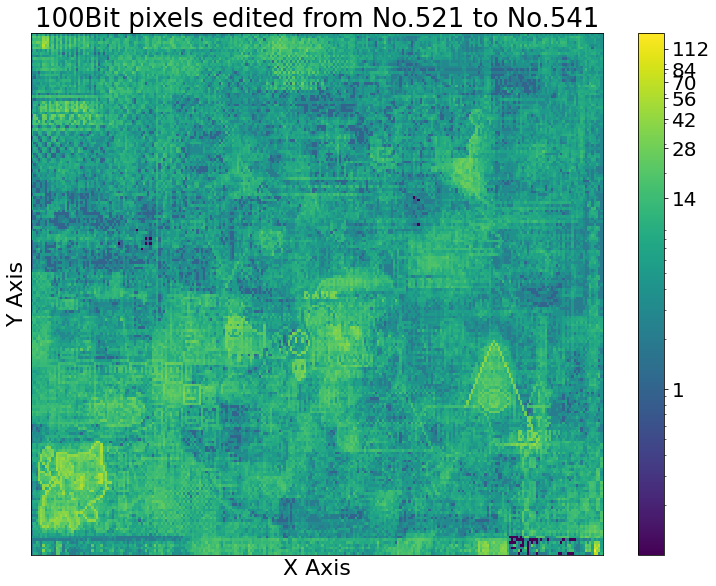

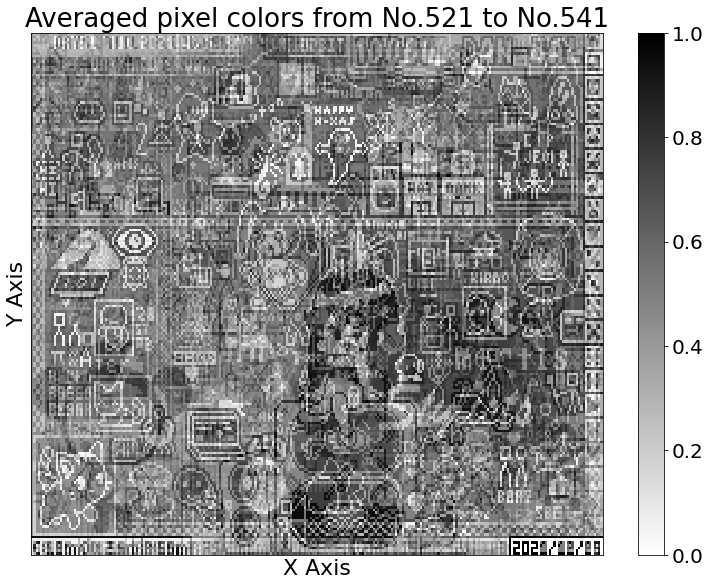

Getting average color of pixels...
Finished, total edits: 4192
Getting number of changes for each pixel...
Total pixels edited: 383414
Mean edits per pixel: 7.800577799479167
Pixels sorted by # of times edited:
x252   y190  :    137
x253   y189  :     91
x252   y189  :     89
x254   y188  :     85
x252   y191  :     85
x252   y188  :     83
x253   y190  :     79
x253   y191  :     79
x253   y188  :     63
x41    y171  :     56
Least popular pixel was at: x76 y191 with 1 edits.


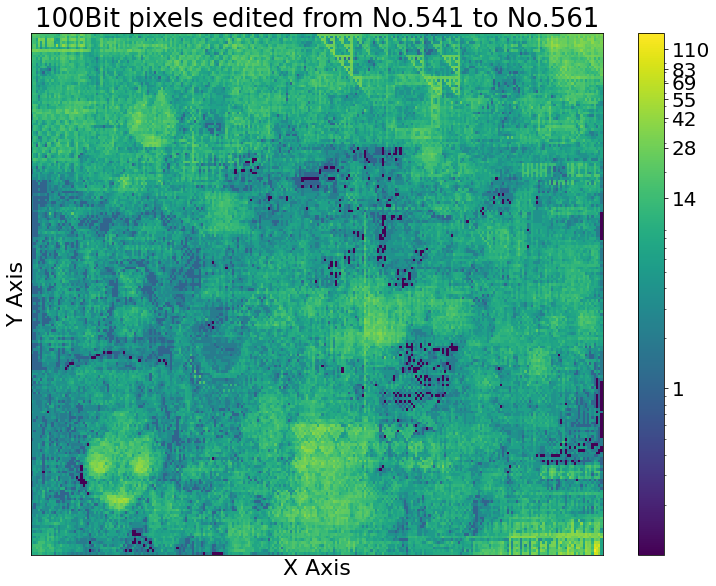

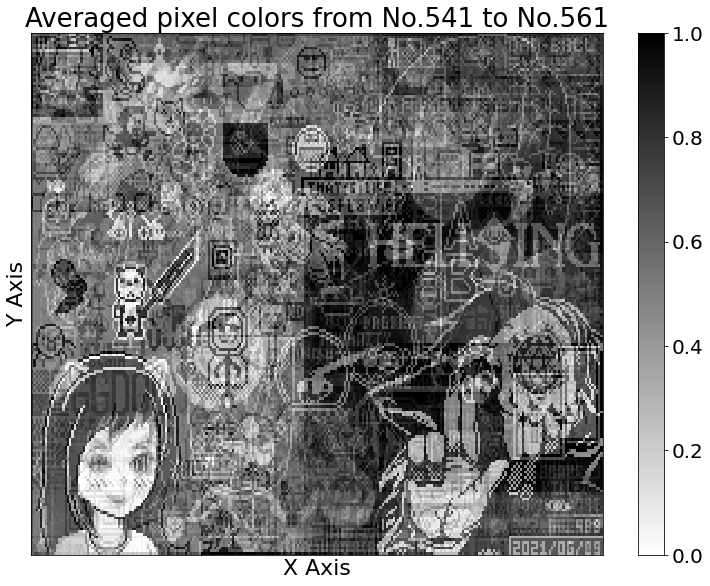

Getting average color of pixels...
Finished, total edits: 4186
Getting number of changes for each pixel...
Total pixels edited: 385288
Mean edits per pixel: 7.838704427083333
Pixels sorted by # of times edited:
x252   y190  :    145
x252   y191  :     88
x253   y191  :     86
x253   y189  :     82
x254   y188  :     79
x252   y188  :     68
x252   y189  :     68
x26    y190  :     54
x250   y66   :     49
x2     y1    :     45
Least popular pixel was at: x255 y191 with 1 edits.


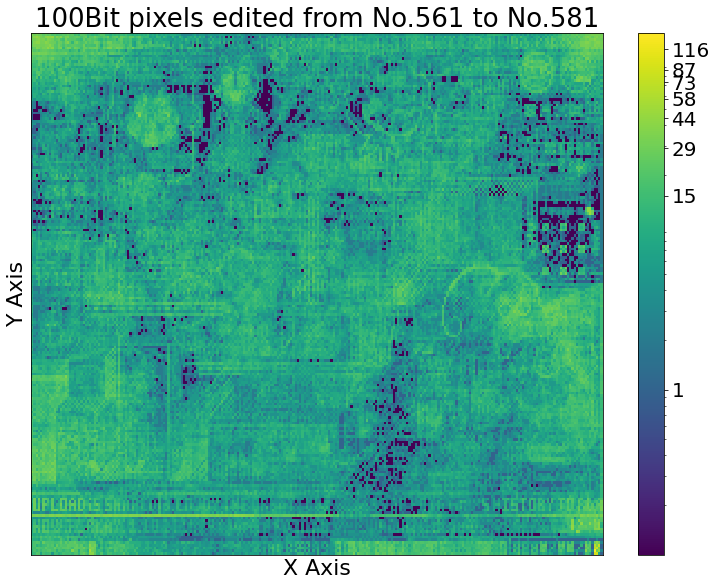

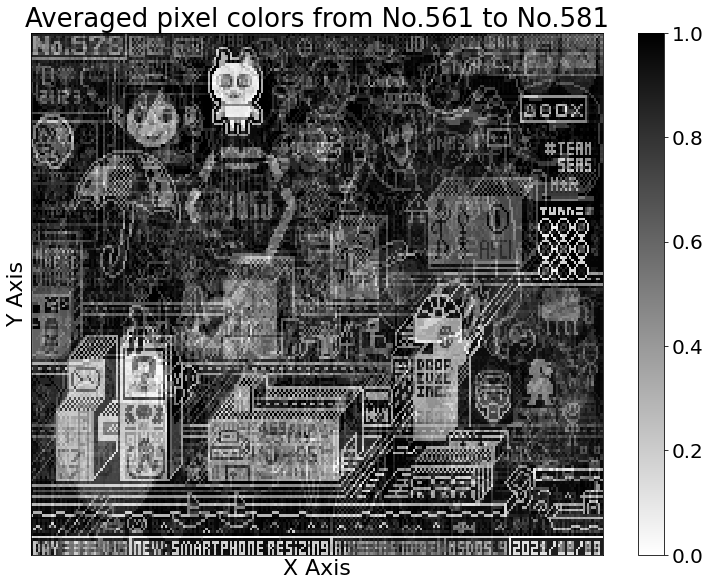

Getting average color of pixels...
Finished, total edits: 1998
Getting number of changes for each pixel...
Total pixels edited: 181055
Mean edits per pixel: 3.6835734049479165
Pixels sorted by # of times edited:
x157   y6    :     91
x154   y7    :     88
x158   y9    :     88
x157   y12   :     88
x157   y8    :     85
x161   y6    :     83
x159   y10   :     83
x155   y11   :     83
x160   y11   :     83
x160   y5    :     82
Least popular pixel was at: x247 y191 with 1 edits.


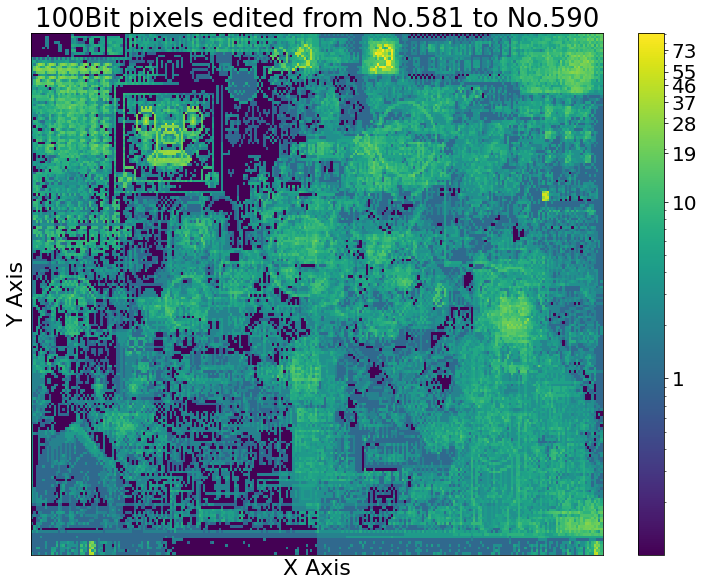

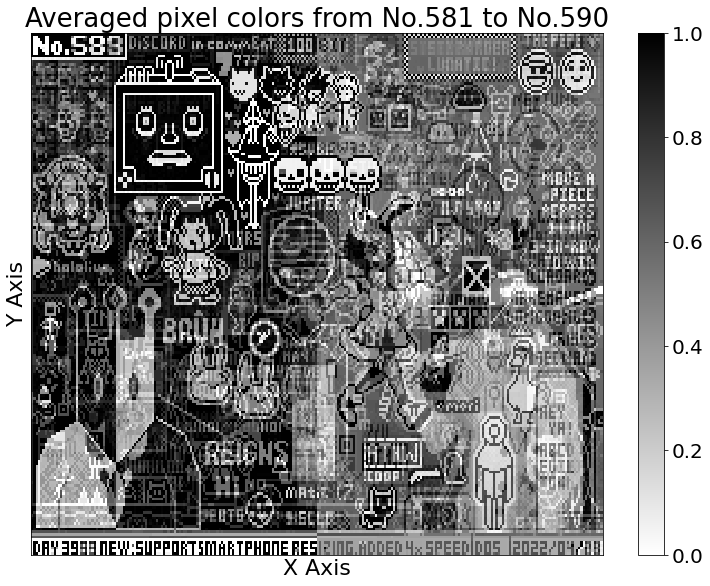

In [18]:
currentNo = args["start"]
spacing = 20 # What range of No.s should be displayed for the heatmap at the same time.
while (currentNo <= args["end"]):
    stopNo = currentNo + spacing
    if (stopNo > args["end"]):
        stopNo = args["end"]
    pixelAverages2D = getPixelColorAverages(wb, currentNo, stopNo)
    pixel_counts2D, firstOccurence, lastOccurence = getPixelsByPopularity(wb, currentNo, stopNo)
    plotHeatMap(pixel_counts2D, title="100Bit pixels edited from No." + str(currentNo) + " to No." + str(stopNo))
    plotHeatMap(pixelAverages2D, title="Averaged pixel colors from No." + str(currentNo) + " to No." + str(stopNo), blackAndWhite = True)
    currentNo += spacing
